<div><img src="https://datascientest.fr/train/assets/logo_datascientest.png", style="height:150px"></div>


<hr style="border-width:2px;border-color:#75DFC1">

<center><h2> Projet Datascientest </h2></center>
<center><h2> Prédiction du succès d’une campagne de Marketing d’une banque </h2></center>

<hr style="border-width:2px;border-color:#75DFC1">

### Description détaillée

> L’analyse des données marketing est une problématique très classique des sciences des
données appliquées dans les entreprises de service. Pour ce jeu de données, nous avons des
données personnelles sur des clients d’une banque qui ont été “télémarketés” pour souscrire à
un produit que l’on appelle un "dépôt à terme”. Lorsqu’un client souscrit à ce produit, il place
une quantité d’argent dans un compte spécifique et ne pourra pas toucher ces fonds avant
l’expiration du terme. En échange, le client reçoit des intérêts de la part de la banque à la fin du
terme.

> Pour ce projet, il faudra d’abord effectuer une analyse visuelle et statistique des facteurs
pouvant expliquer le lien entre les données personnelles du client (âge, statut marital, quantité
d’argent placé dans la banque, nombre de fois que le client a été contacté, etc.) et la variable
cible “Est-ce que le client a souscrit au dépôt à terme?”.

> Une fois l’analyse visuelle terminée, vous devrez utiliser les techniques de machine learning
vues pendant la formation pour déterminer à l’avance si un client va souscrire au produit ou
non. Une fois cette prédiction réalisée, vous devrez utiliser les techniques d’interprétabilité des
modèles de machine learning pour expliquer à l’échelle d’un individu pourquoi il est plus
susceptible de souscrire au produit ou non. 

> **L’interprétabilité du modèle sera fondamentale pour conclure votre analyse, et donc le projet**.

### Data

Le jeu de données est téléchargeable au lien suivant:
https://www.kaggle.com/janiobachmann/bank-marketing-dataset

In [1]:
# importation des tables de base
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 

In [2]:
# importation des données
data = pd.read_csv('bank.csv')

In [3]:
# copie du dataset
df = data.copy()

# Exploration des données

- Comprendre au maximum les données dont on dispose pour définir une stratégie de modélisation

In [4]:
# affichage des 5 premières lignes du dataset
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


> La donnée que l'on cherche à prédire dans ce projet est **deposit**.

In [5]:
# structure du dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


>**Taille du dataset** : 17 colonnes, avec un total de 11162 entrées.

In [6]:
# type de variables
df.dtypes.value_counts()

object    10
int64      7
dtype: int64

>**Types de variables** : 10 object et 7 int64.

In [7]:
# check des valeurs manquantes
df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64

> Il n'y a pas de valeur manquante (NaN) dans le dataset.

In [8]:
# check des doublons
df.duplicated().sum()

0

> Il n'y a pas de doublon dans le dataset

In [9]:
# liste de valeur disponible pour les valeurs catégoriques
for col in df.select_dtypes('object'):
    print(f'{col :-<15}{df[col].unique()}')

job------------['admin.' 'technician' 'services' 'management' 'retired' 'blue-collar'
 'unemployed' 'entrepreneur' 'housemaid' 'unknown' 'self-employed'
 'student']
marital--------['married' 'single' 'divorced']
education------['secondary' 'tertiary' 'primary' 'unknown']
default--------['no' 'yes']
housing--------['yes' 'no']
loan-----------['no' 'yes']
contact--------['unknown' 'cellular' 'telephone']
month----------['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'jan' 'feb' 'mar' 'apr' 'sep']
poutcome-------['unknown' 'other' 'failure' 'success']
deposit--------['yes' 'no']


> Cependant, on peut noter la présence de valeur "unknown" dans job, education, contact et poutcome.

## Descriptif des variables du dataset

- **age** : (int) age
- **job** : (object) métier- ['admin.', 'technician', 'services', 'management', 'retired',
   'blue-collar', 'unemployed', 'entrepreneur', 'housemaid',
   'unknown', 'self-employed', 'student']
- **marital** : (object) statut matrimonial - ['married', 'single', 'divorced']
- **education** : (object) niveau d'éducation - ['secondary', 'tertiary', 'primary', 'unknown']
- **default** : (object) a un crédit en défaut de paiement - ['no', 'yes']
- **balance** : (int) solde du compte
- **housing** : (object) a un crédit immobilier - ['yes', 'no']
- **loan** : (object) a un autre crédit - ['no', 'yes']
- **contact** : (object) moyen utilisé pour contacté le client - ['unknown', 'cellular', 'telephone']
- **day** : (int) jour du dernier contact
- **month** : (object) mois du dernier contact - ['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'jan', 'feb',
   'mar', 'apr', 'sep']
- **duration** : (int) durée du dernier contact
- **campaign** : (int) nombre de contact lors de cette campagne
- **pdays** : (int) nombre de jour depuis le dernier contact
- **previous** : (int) nombre de contact total lors des campagnes précédentes
- **poutcome** : (object) résultat de la précédente campagne - ['unknown', 'other', 'failure', 'success'] 
- **deposit** : (object) le client a t-il souscrit un dépot à terme - ['yes', 'no']

### Exploration des valeurs unknown

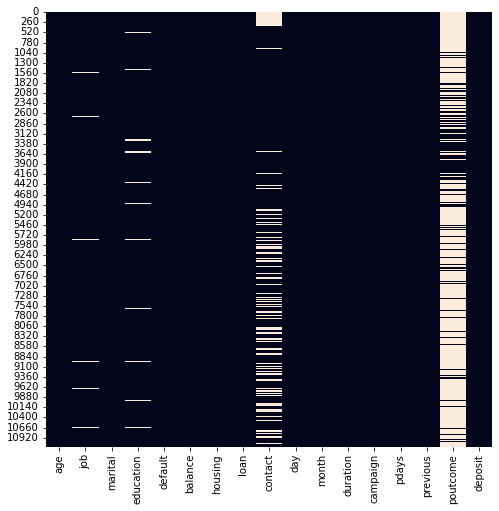

In [10]:
# exploration visuelle des valeurs unknown
plt.figure(figsize=(8,8))
sns.heatmap(df=='unknown', cbar=False);
# case blanche = unknown

In [11]:
# on affiche le pourcentage de données avec unknown pour les 4 colonnes concernées
(df=='unknown').sum().sort_values(ascending=False).head(4)/df.shape[0]*100

poutcome     74.592367
contact      21.017739
education     4.452607
job           0.627128
dtype: float64

> Il y a très peu de valeurs manquantes dans job et education. On pourra envisager de supprimer ces lignes. En ce qui concerne contact et poutcome, il faut obtenir plus d'information.

## Relation entre les variables et deposit

In [12]:
'''fonction permettant d'afficher les graphiques des variables catégoriques ci-dessous'''

# pie chart - répartition de col
def col_pie(col):
    plt.figure(figsize=(7,7))
    ax = plt.pie(
        col.value_counts(), 
        labels = col.value_counts().index, 
        autopct = '%1.1f%%',
        colors = sns.color_palette('pastel')
    )
    plt.title("Répartition des valeurs dans " + col.name)
    
    
# countplot - col en fonction de deposit  
def col_count(col):
    plt.figure(figsize=(13,5))
    ax = sns.countplot(data=df, x=col, hue='deposit', alpha=0.7, edgecolor="black")
    plt.xticks(rotation=45)
    for container in ax.containers:
        ax.bar_label(container)
    plt.title(col.name + " en fonction de deposit (volume)")
    
    
# heatmap - proportion de col en fonction de deposit
def col_heat(col):
    plt.figure(figsize=(17,3))
    data_fig = pd.crosstab(df['deposit'], col, normalize=1)
        # tri des colonnes pour correspondre au graphique précédent
    data_fig = data_fig[col.unique()]
    ax = sns.heatmap(data_fig, annot=True, cmap='coolwarm', center=0.5)
    plt.title(col.name + " en fonction de deposit (proportion)")

    
# 3 en 1
def col_all(col):
    col_pie(col)
    col_count(col)
    col_heat(col)

In [13]:
'''fonction permettant d'incrémenter de 1 tous les éléments d'une liste'''
# utile pour la fonction suivante
def incrementation_list(L):
    list_add_1 = L[:]
    for element in range(len(list_add_1)):
        list_add_1[element] = int(list_add_1[element] + 1)
    return list_add_1

In [14]:
'''fonction permettant de catégoriser une valeur numérique en nb class'''
def col_classes(df, col, nb):
    
    list_Q = []
    k = 0    
        
    # on définit la liste des percentile
    for Q in range(nb+1):
        Q = np.percentile(df[col], 100/nb*k)
        if k == 0:
            Q -= 1
        list_Q.append(Q)
        k += 1
        
    # on créé une colonne pour chaque nouvelle classe
    df[col+'_classes'] = pd.cut(df[col], 
                                bins = list_Q,
                                labels = incrementation_list(list_Q[:-1]))
    
    # on affiche pour chacune des nouvelles classes, la proportion de souscription à deposit
    plt.figure(figsize=(20,3))
    sns.heatmap(pd.crosstab(df['deposit'], df[col+'_classes'], normalize=1),annot=True,cmap='coolwarm', center=0.5)
    plt.title('Proportion de deposit pour les classes ' + col);
    
    return df[col].groupby(by=df[col+'_classes']).describe()

### Distribution de la target deposit

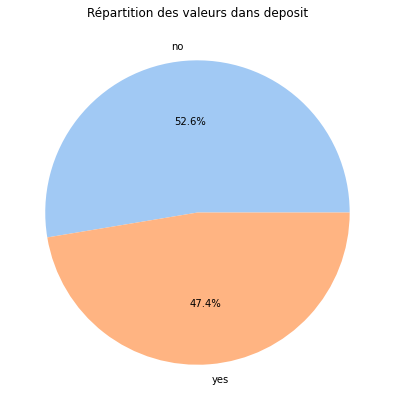

In [15]:
# pie chart deposit
col_pie(df['deposit'])

> La target est très équilibré, rendant ainsi la métrique accuracy pertinente.

### Visualisation des données numériques

In [16]:
# distribution des colonnes numériques
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000
mean,41.231948,1528.538524,15.658036,371.993818,2.508421,51.330407,0.832557
std,11.913369,3225.413326,8.420740,347.128386,2.722077,108.758282,2.292007
min,18.000000,-6847.000000,1.000000,2.000000,1.000000,-1.000000,0.000000
25%,32.000000,122.000000,8.000000,138.000000,1.000000,-1.000000,0.000000
50%,39.000000,550.000000,15.000000,255.000000,2.000000,-1.000000,0.000000
75%,49.000000,1708.000000,22.000000,496.000000,3.000000,20.750000,1.000000
max,95.000000,81204.000000,31.000000,3881.000000,63.000000,854.000000,58.000000


> Il n'y a pas de valeur abbérantes, toutes les données sont plausibles (age 18-95 ans, day 1-31 etc).
> Il y a un écart significatif sur les échelles de données. Balance va de -6847 à 81204, tandis que l'age va de 18 à 95. On devra donc normaliser les données pour nos modèles.

### Colonne age

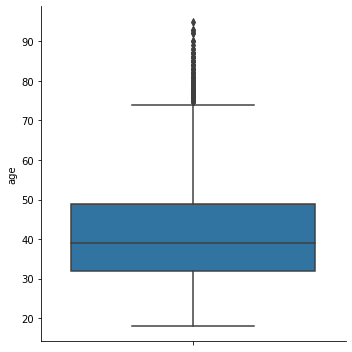

In [17]:
# distribution de l'age
sns.catplot(data=df, y='age', kind='box');

> La majorité des clients à entre 30 et 50 ans.

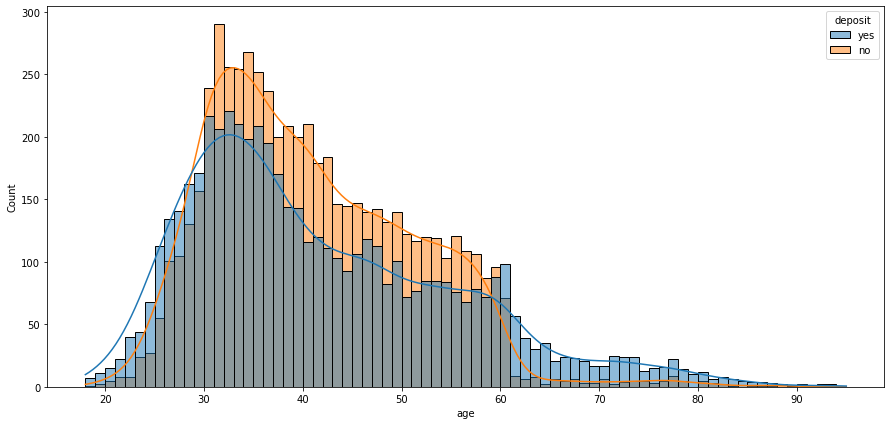

In [18]:
# distribution de l'age en fonction de deposit
plt.figure(figsize=(15,7))
sns.histplot(data=df, x='age', hue='deposit', kde=True, binwidth=1);

> Les clients de 19-29 ans et les 60+ ont plus tendance à dire oui. En revanche pour les 30-59 ans, c'est le non qui l'emporte.

,count,mean,std,min,25%,50%,75%,max
age_classes,,,,,,,,
18,1223.0,25.714636,2.190107,18.0,25.0,26.0,27.0,28.0
29,1280.0,30.131250,0.791842,29.0,29.0,30.0,31.0,31.0
32,941.0,32.493092,0.500218,32.0,32.0,32.0,33.0,33.0
34,1359.0,34.974982,0.812798,34.0,34.0,35.0,36.0,36.0
37,1066.0,37.974672,0.817827,37.0,37.0,38.0,39.0,39.0
40,920.0,40.966304,0.821339,40.0,40.0,41.0,42.0,42.0
43,1253.0,45.025539,1.416240,43.0,44.0,45.0,46.0,47.0
48,1048.0,49.937977,1.418586,48.0,49.0,50.0,51.0,52.0
53,1108.0,55.385379,1.695534,53.0,54.0,55.0,57.0,58.0


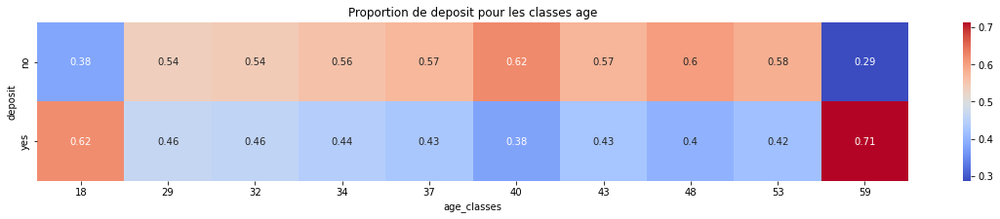

In [19]:
# on découpe l'age en plusieurs classes de taille similaire (en terme de données)
col_classes(df, 'age', 10)

> En coupant l'age en 10 classes, on observe également que c'est les plus jeune et les plus agés qui souscrivent. Pour le reste des clients, c'est relativement similaire. On peut tout de même noter des score un peu plus bas autour de 40-50 ans.

### Colonne balance

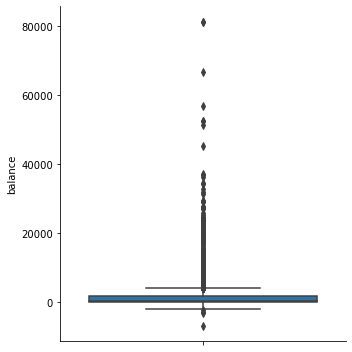

In [20]:
# distribution de la balance.
sns.catplot(data=df, y='balance', kind='box');

> Il y a des valeurs extrême qui écrase le graphique. Il faudra certainement retravailler ces données par la suite. On va également réaliser un focus sur les balances élevés.

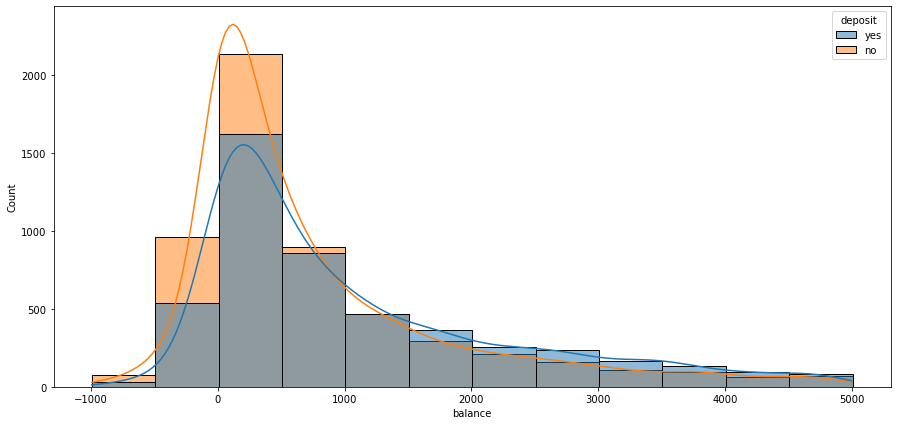

In [21]:
# distribution de la balance en fonction de deposit (exclusion des outliers pour ne pas écraser le graphique)
plt.figure(figsize=(15,7))
sns.histplot(data=df[(df['balance']>-1000) & (df['balance']<=5000)], x='balance', hue='deposit', kde=True, binwidth=500);

> On observe moins de souscriptions pour les plus faibles balance. Cela s'équilibre à partir de 1000 euros.

,count,mean,std,min,25%,50%,75%,max
balance_classes,,,,,,,,
-6847,1462.0,-152.379617,329.087753,-6847.0,-210.75,0.0,0.00,0.0
1,778.0,26.041131,19.259880,1.0,8.00,23.0,43.00,62.0
63,1109.0,123.330027,35.932287,63.0,93.00,123.0,154.00,189.0
190,1119.0,261.521895,43.443682,190.0,223.00,261.0,300.00,337.0
338,1115.0,439.281614,60.617347,338.0,386.00,437.0,491.00,550.0
551,1114.0,689.955117,89.656536,551.0,608.25,681.5,767.00,862.0
863,1116.0,1079.656810,141.599446,863.0,951.00,1070.0,1204.25,1340.0
1341,1118.0,1732.496422,249.546578,1341.0,1521.00,1708.5,1943.75,2223.0
2224,1114.0,2944.773788,477.962356,2225.0,2544.00,2885.0,3342.75,3885.0


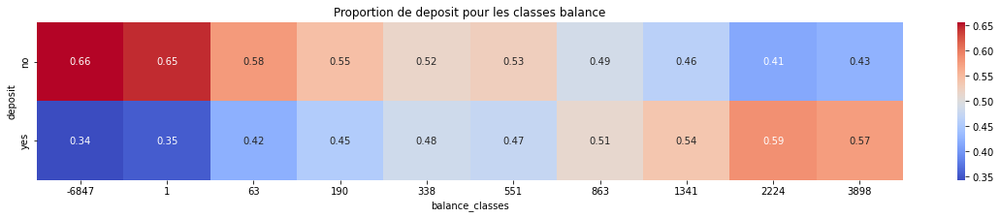

In [22]:
# création de 10 classes pour balance
col_classes(df, 'balance', 10)

> On observe une tendance net. Plus la balance augmente, plus le client est susceptible de souscrire. 

> Certaines valeurs sont suprenantes, on aurait tendance à croire qu'aucune souscription ne se fait avec un solde négatif. On constate bien que le taux de succès est plus bas pour les soldes négatifs, mais on obtient tout de même 1/3 de oui.



C:\Users\jonat\AppData\Local\Temp/ipykernel_7616/1091810680.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col+'_classes'] = pd.cut(df[col],


,count,mean,std,min,25%,50%,75%,max
balance_classes,,,,,,,,
3899,373.0,4468.000000,347.801219,3899.0,4151.0,4464.0,4745.00,5106.0
5107,372.0,6183.244624,762.307019,5108.0,5475.0,6027.0,6810.75,7724.0
7725,372.0,13944.096774,9318.953612,7735.0,8876.0,10894.5,14524.75,81204.0


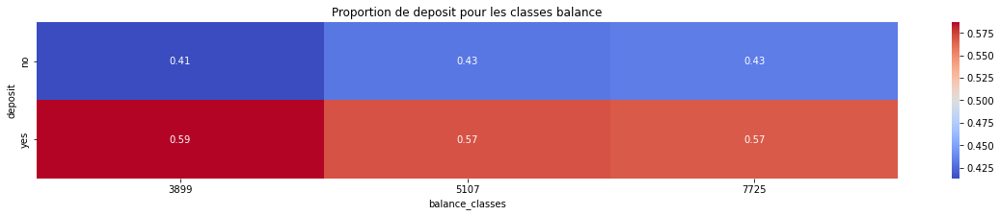

In [23]:
# création de 3 classes pour les revenus supérieur à 3898
col_classes(df[df['balance_classes'] == 3898], 'balance', 3)

> Lorsqu'on se concentre sur les balance les plus haute, la tendance positive disparait. Il semble donc qu'a partir d'un certain seuil, la balance n'est plus un facteur important.

### Colonne day

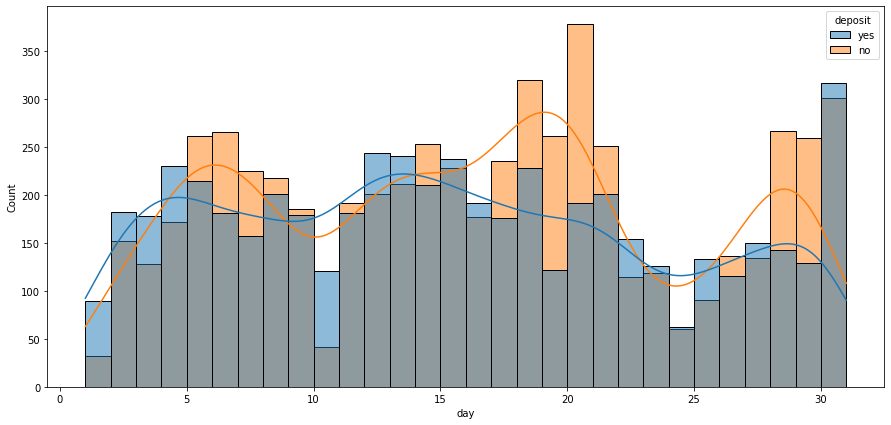

In [24]:
# distribution de day en fonction de deposit
plt.figure(figsize=(15,7))
sns.histplot(data=df, x='day', hue='deposit', kde=True, binwidth=1);

> Il n'y a pas de tendance clair qui se dégage sur day.

,count,mean,std,min,25%,50%,75%,max
day_classes,,,,,,,,
1,3789.0,6.180523,2.831810,1.0,4.0,6.0,8.0,11.0
12,4109.0,16.099294,2.641031,12.0,14.0,16.0,18.0,20.0
21,3264.0,26.104473,3.277416,21.0,23.0,27.0,29.0,31.0


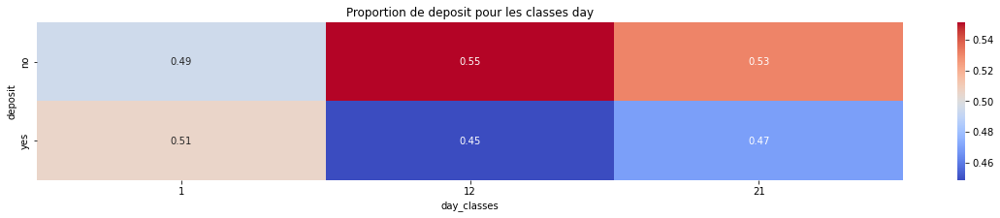

In [25]:
#création de 3 classes pour day
col_classes(df, 'day', 3)

> Le jour du contact à l'air d'avoir très peu d'incidence dans la décision finale du client. Cela semble logique, si je suis prêt a accepté de souscrire le 5 du mois, cela devrait vraisemblablement être également le cas le 20. Un facteur qui peut entrer en jeu, c'est la date de paie ainsi que des factures des client.

### Colonne duration

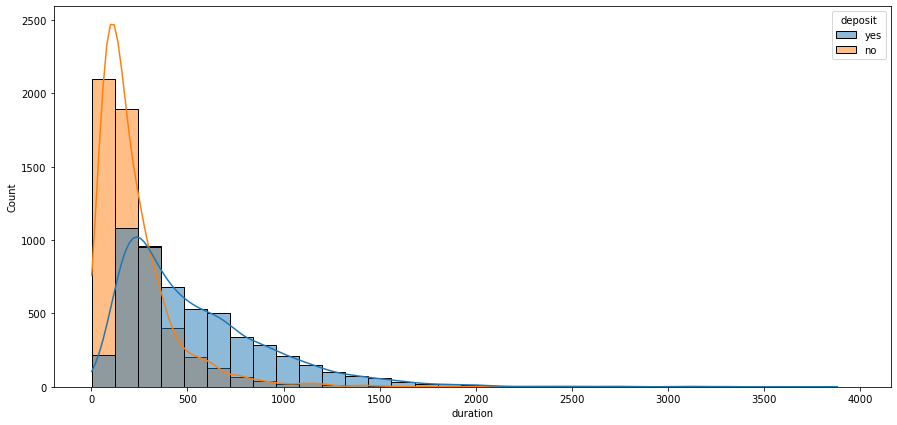

In [26]:
# distribution de day en fonction de deposit
plt.figure(figsize=(15,7))
sns.histplot(data=df, x='duration', hue='deposit', kde=True, binwidth=120);

> La durée s'exprime en seconde. Ici chaque barre représente 2 minutes. Une court échange (moins de 4 minutes) implique souvent un non.

,count,mean,std,min,25%,50%,75%,max
duration_classes,,,,,,,,
2,1134.0,47.111111,21.602973,2.0,29.00,51.5,65.0,77.0
78,1128.0,98.993794,11.964565,78.0,89.00,99.0,109.0,119.0
120,1089.0,139.236915,11.314800,120.0,130.00,139.0,149.0,158.0
159,1127.0,180.057675,13.317054,159.0,168.00,179.0,192.0,204.0
205,1114.0,229.581688,14.857486,205.0,216.00,229.0,243.0,255.0
256,1107.0,286.779584,19.998106,256.0,268.00,285.0,304.0,323.0
324,1115.0,368.287892,28.172790,324.0,343.00,366.0,393.0,420.0
421,1119.0,498.922252,47.438994,421.0,458.00,496.0,538.5,585.0
586,1114.0,696.820467,71.373951,586.0,636.25,689.5,755.0,838.0


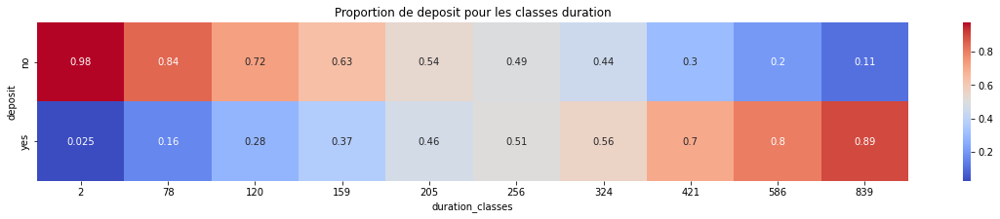

In [27]:
# création de 10 classes pour duration
col_classes(df, 'duration', 10)

> On observe une tendance très nette. Plus la durée de l'appel est élevé, plus le client à de chance de souscrire. La durée semble avoir un impact très fort sur deposit. Cependant, nous ne pourrons pas utiliser cette donnée dans le cadre du modèle prédictif. En effet, la durée n'est connue qu'une fois que l'appel est effectué. Or, nous souhaitons justement prédire si c'est pertinent ou non de le contacter.

### Colonne campaign

count    11162.000000
mean         2.508421
std          2.722077
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         63.000000
Name: campaign, dtype: float64

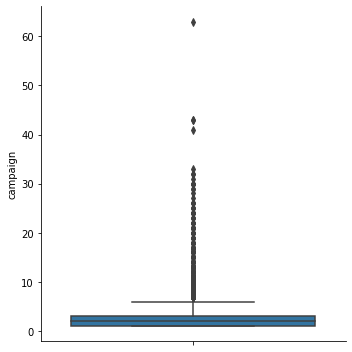

In [28]:
# districution de campaign
sns.catplot(data=df, y='campaign', kind='box');
df['campaign'].describe()

> Le graphique est écrasé a cause des valeurs extrêmes. La majorité des clients ont été contactés 3 fois ou moins.

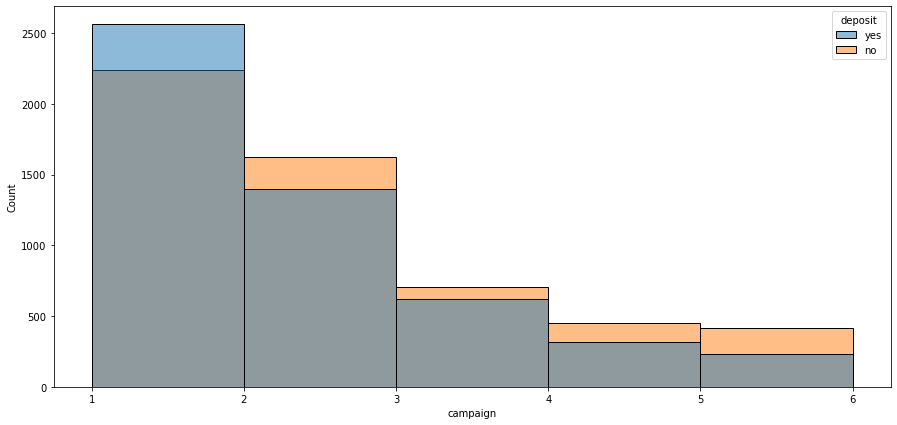

In [29]:
# distribution de campaign en fonction de deposit
plt.figure(figsize=(15,7))
sns.histplot(data=df[df['campaign']<= 6], x='campaign', hue='deposit', binwidth=1);

> De prime abord, on pourrait croire que plus on appel, moins on est efficace. Cependant, campaign = 1 montre uniquement les clients ayant fait un seul appel. Pourtant un client avec campaign = 2 a refusé la proposition lors du premier appel. On va retravailler les données plus tard pour avoir une meilleure vision du taux d'acceptation. Comme pour duration, ce champ ne sera pas utilisé pour le modèle prédictif, car nous ne connaissons pas cette donnée tant que la campagne n'est pas terminée. On pourra tout de même étudier le taux de retour en fonction du nombre d'appels et le prendre en compte lors des futurs campagnes.

### Colonne pdays

,count,mean,std,min,25%,50%,75%,max
pdays_classes,,,,,,,,
-1,8324.0,-1.000000,0.000000,-1.0,-1.0,-1.0,-1.0,-1.0
0,2838.0,204.818182,122.196901,1.0,98.0,182.0,286.0,854.0


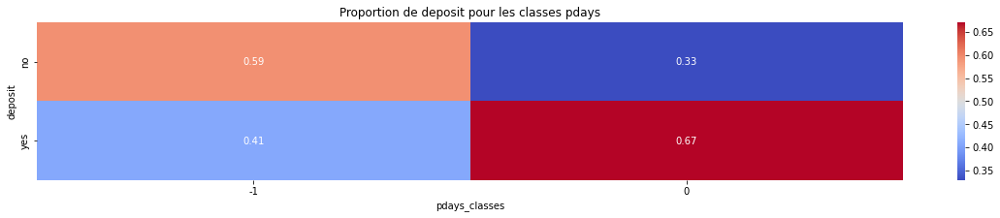

In [30]:
# création de 2 classes en fonction de pdays
col_classes(df, 'pdays', 2)

> Il y a beaucoup de clients avec previous = -1. C'est les clients qui n'ont jamais été contacté auparavant. On constate que les clients déjà connus de la banque sont plus susceptible de souscrire le DAT.

C:\Users\jonat\AppData\Local\Temp/ipykernel_7616/1091810680.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col+'_classes'] = pd.cut(df[col],


,count,mean,std,min,25%,50%,75%,max
pdays_classes,,,,,,,,
1,297.0,62.579125,29.186284,1.0,43.0,78.0,86.0,89.0
90,305.0,91.924590,1.174378,90.0,91.0,92.0,93.0,94.0
95,251.0,99.741036,3.929462,95.0,96.0,99.0,103.0,109.0
110,292.0,141.551370,18.769925,110.0,125.0,141.0,160.0,170.0
171,304.0,179.194079,3.253609,171.0,177.0,181.0,182.0,182.0
183,269.0,185.505576,2.331838,183.0,183.0,185.0,187.0,190.0
191,269.0,216.881041,23.114106,191.0,196.0,208.0,238.0,259.0
260,285.0,287.715789,19.193417,260.0,270.0,286.0,302.0,324.0
325,283.0,344.583039,10.006877,325.0,337.0,345.0,352.0,362.0


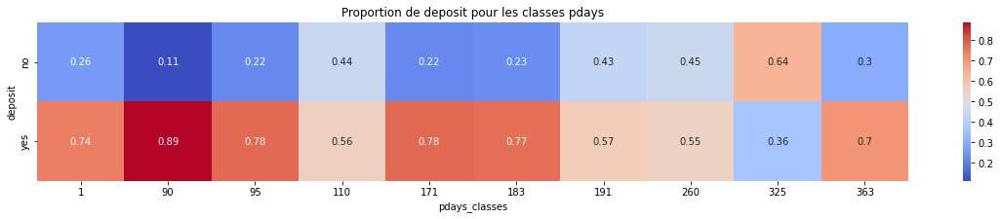

In [31]:
# on exclus pdays = -1 et on découpe en 10 classes de taille similaire
col_classes(df[df['pdays']> -1], 'pdays', 10)

> Quand on regarde les proportions de oui en fonction de pdays, on ne constate pas de tendance nette. Les scores montent et descendent sans vraiment de logique.

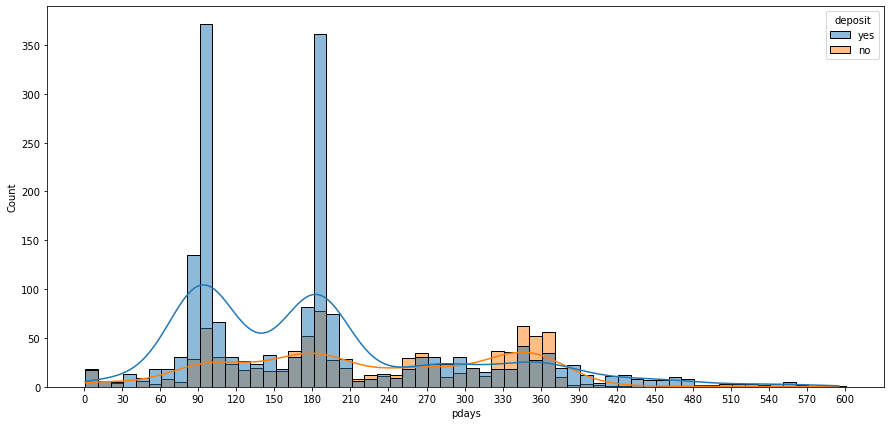

In [32]:
# distribution de day en fonction de deposit
plt.figure(figsize=(15,7))
sns.histplot(data=df[(df['pdays']>-1) & (df['pdays'] <=600)], x='pdays', hue='deposit', kde=True, binwidth=10);
plt.xticks(ticks=np.arange(0,630,30));

> En revanche, ici on comprend mieux les score du graphique précédent. Il y a eu 2 grosses campagnes d'appels, autour de 90 et 180 jours qui ont un très bon succès. On a également deux campagnes d'appels plus discrètes, autour de 270 jours et de 360 jours. La banque semble faire des campagnes par trimestres car 90 180 270 et 360 jours représentent respectivement 3, 6, 9 et 12 mois.

### Colonne previous

,count,mean,std,min,25%,50%,75%,max
previous_classes,,,,,,,,
0,8324.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
1,2838.0,3.274489,3.559216,1.0,1.0,2.0,4.0,58.0


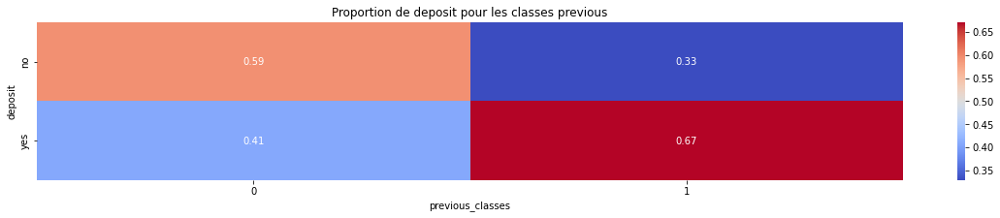

In [33]:
# création de 2 classes pour previous
col_classes(df, 'previous', 2)

In [34]:
# les chiffres semblent similaire entre previous = 0 & pdays = -1, on vérifie cela
pd.crosstab(df['previous']==0, df['pdays']==-1)

pdays,False,True
previous,,
False,2838,0
True,0,8324


> On constate que previous = 0 et pdays = -1 sont équivalent, cela correspond au fait que le client n'avait jamais été contacté auparavant.

C:\Users\jonat\AppData\Local\Temp/ipykernel_7616/1091810680.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col+'_classes'] = pd.cut(df[col],


,count,mean,std,min,25%,50%,75%,max
previous_classes,,,,,,,,
1,887.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2,693.0,2.000000,0.000000,2.0,2.0,2.0,2.0,2.0
3,435.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0
4,409.0,4.403423,0.491185,4.0,4.0,4.0,5.0,5.0
6,414.0,9.454106,5.772656,6.0,6.0,8.0,10.0,58.0


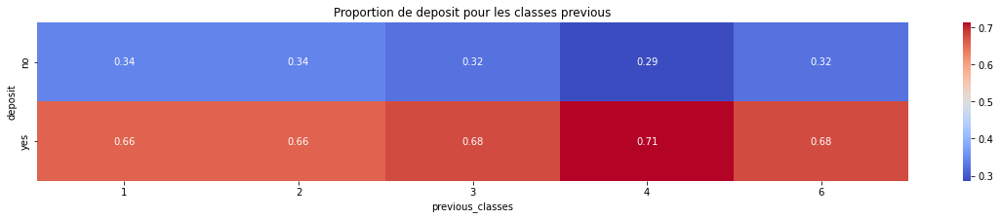

In [35]:
# creation de 5 classes pour previous > 0
col_classes(df[df['previous']> 0], 'previous', 5)

> Lorsque previous est supérieur à 0, on constate que les valeurs sont similaire. Cela veut dire que le nombre de contact auprès du client n'a pas d'importance. Ce qui compte, c'est de savoir si oui ou non il a été contacté au moins une fois. On pourra donc transformer cette information en une variable binaire.

In [36]:
# on créé deux dataset avec previous = 0 & previous > 0, dans le but de faire des comparatif plus juste
# entre ancien et nouveau client
df_previous = df[df['previous'] > 0]
df_no_previous = df[df['previous'] == 0]

### Visualisation des colonne catégoriques

### Colonne job

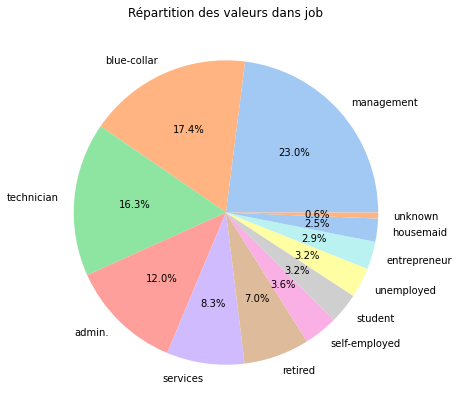

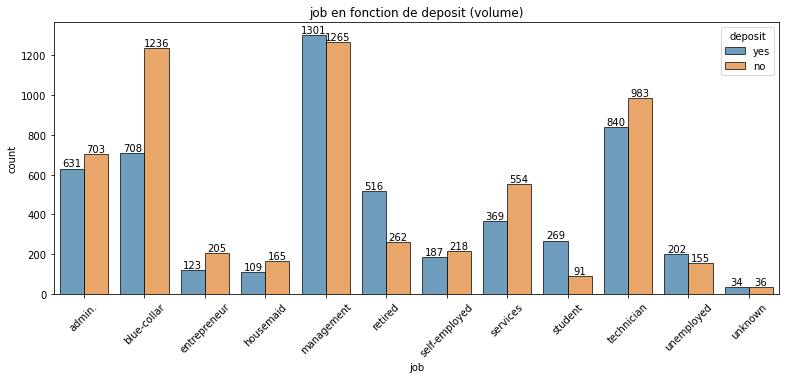

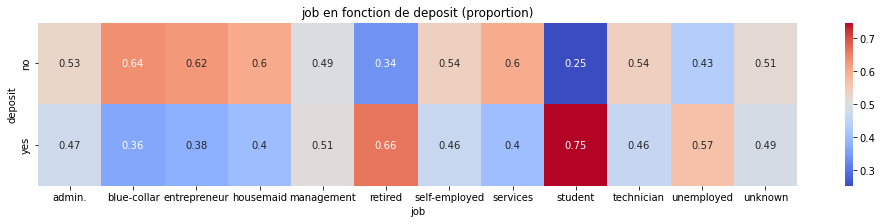

In [37]:
# info sur job
col_all(df['job'].sort_values());

> 75% des étudiants souscrivent au DAT, suivi des retraitées avec 66%, il semble donc que les personnes qui ne font pas partie de la population active sont plus suseptibles de soucrire un DAT. On peut aussi noter que certains emplois comme col-bleu ou entrepeneur ont un résultat en deça de la moyenne.

### Distribution de balance en fonction du job

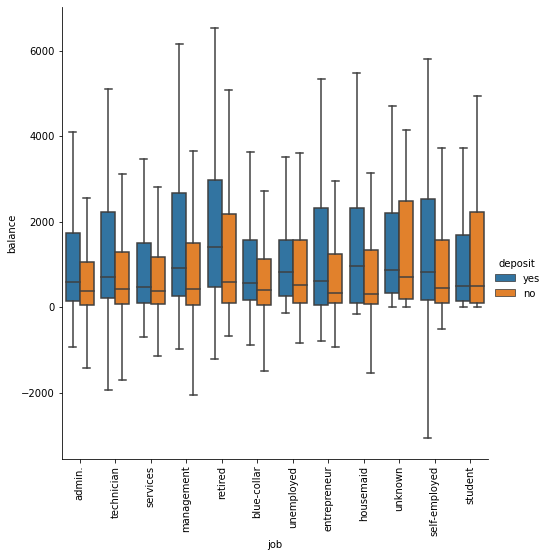

In [38]:
# distribution de balance en fonction de job
sns.catplot(data=df, x='job', y='balance', kind='box', hue='deposit', showfliers=False, height=7)
plt.xticks(rotation=90);

### Colonne marital

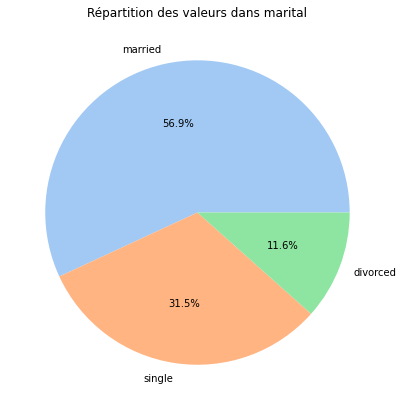

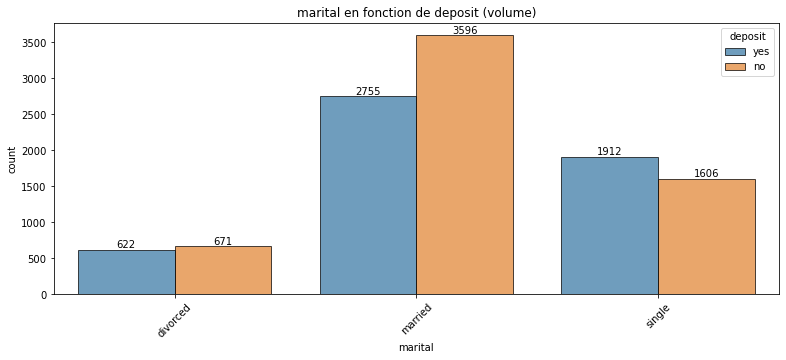

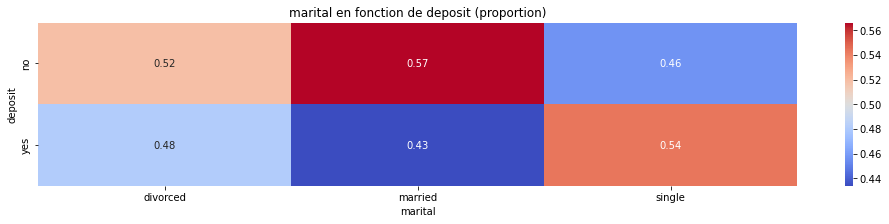

In [39]:
# info sur marital
col_all(df['marital'].sort_values());

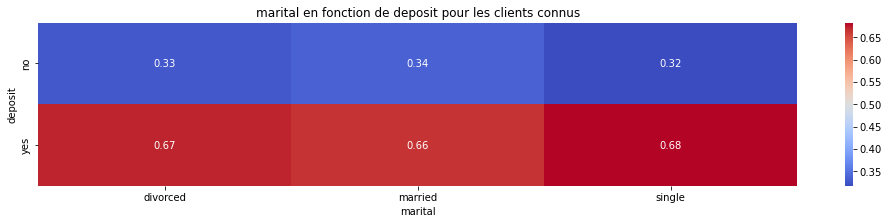

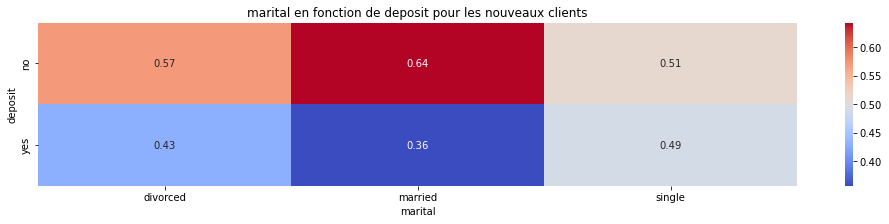

In [40]:
# résultat de marital en fonction de previous = 0 ou presvious > 0
col_heat(df_previous['marital'].sort_values())
plt.title('marital en fonction de deposit pour les clients connus')
col_heat(df_no_previous['marital'].sort_values())
plt.title('marital en fonction de deposit pour les nouveaux clients');

> Le statut marital n'a pas d'impact pour les clients connus. Les scores sont similaire. En revanche, il y a des écarts lorsque c'est des nouveaux clients. Les personnes marriés souscrivent moins. On peut imaginer que les personnes souscrivent moins lors d'un démarchage, ne souhaitant pas prendre une initiative sans l'avis du conjoint.

### Colonne education

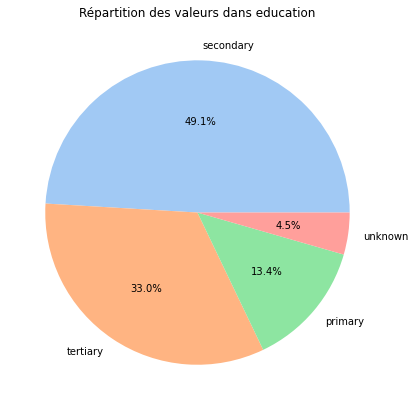

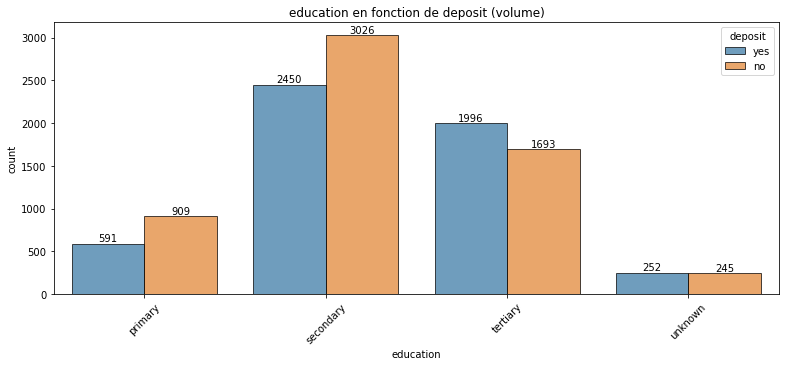

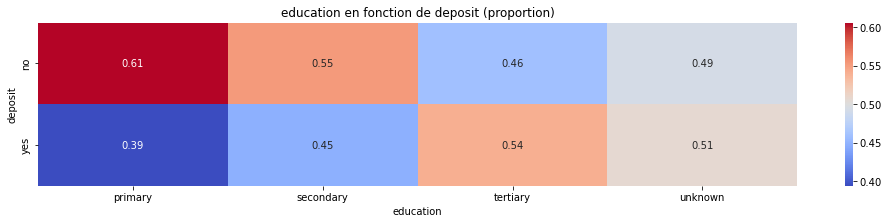

In [41]:
# info sur education
col_all(df['education'].sort_values());

> Plus le niveau d'éducation est élevé, plus on a de chance de souscrire un DAT.

### Colonne default

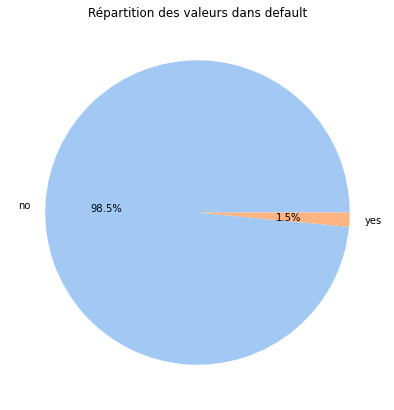

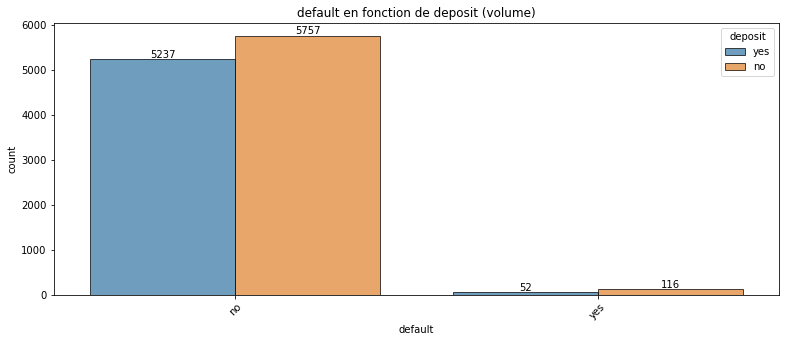

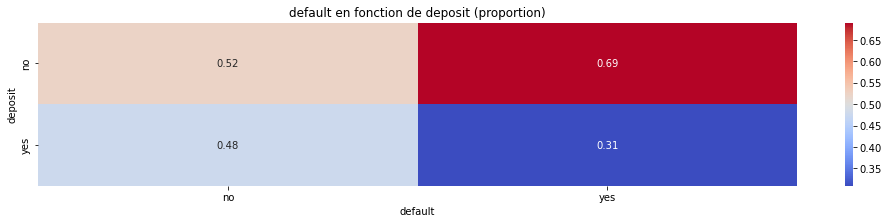

In [42]:
# info sur  default
col_all(df['default']);

> Les clients en default ont tendance à moins souscrire que les autres. En revanche, il y a très peu de ce type de client dans le jeu de données pour que ça soit pertinent.

### Colonne housing

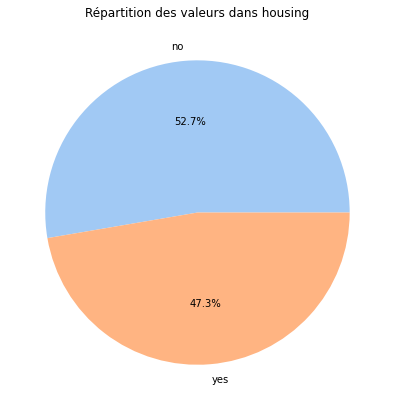

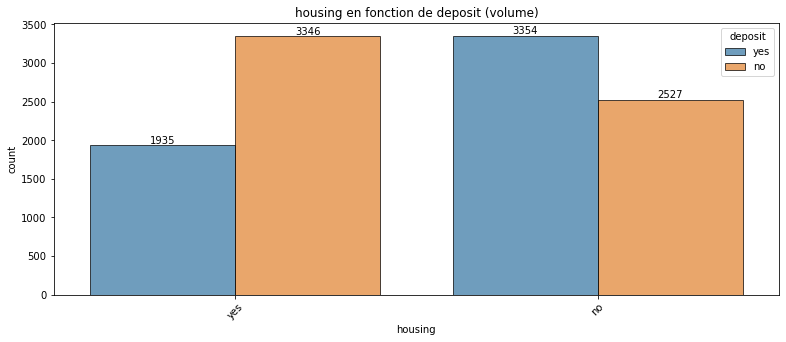

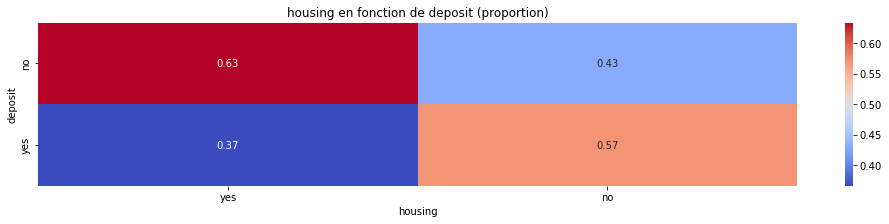

In [43]:
# info sur  housing
col_all(df['housing']);

> Les clients qui ont des obligations de remboursement de crédits immobiliers ont moins tendance à souscrire au dépôt à terme.


### Colonne loan

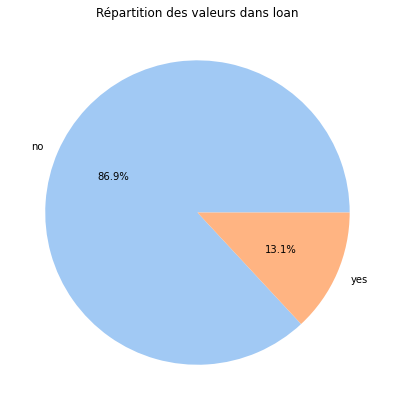

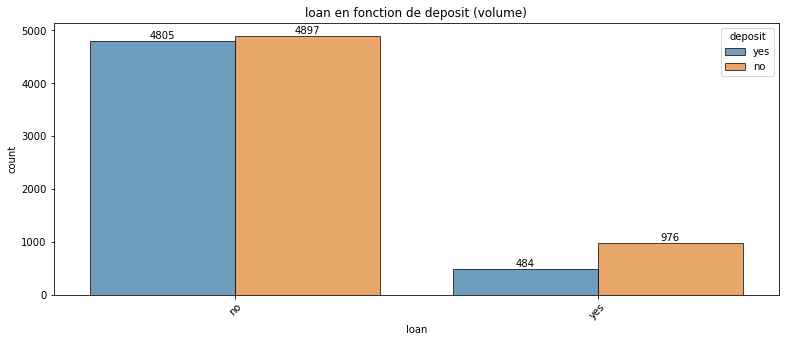

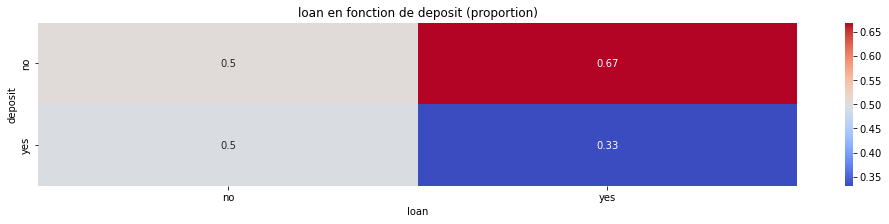

In [44]:
# info sur loan
col_all(df['loan']);

> Les clients qui ont des obligations de remboursement de crédits ont moins tendance à souscrire au dépôt à terme.



### Nombre de crédit chez le client

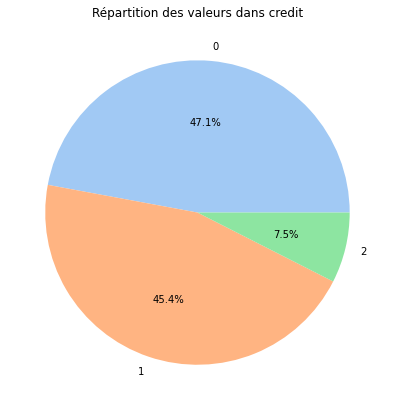

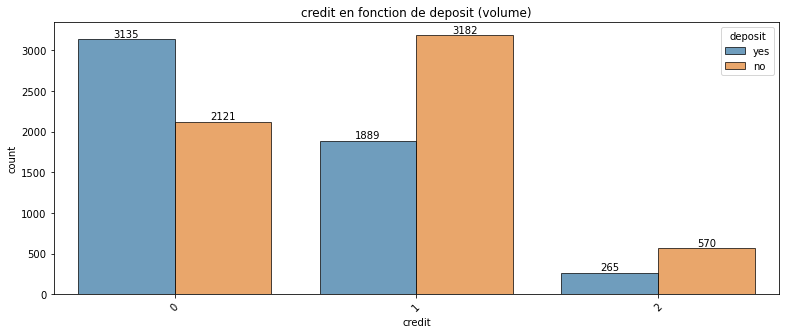

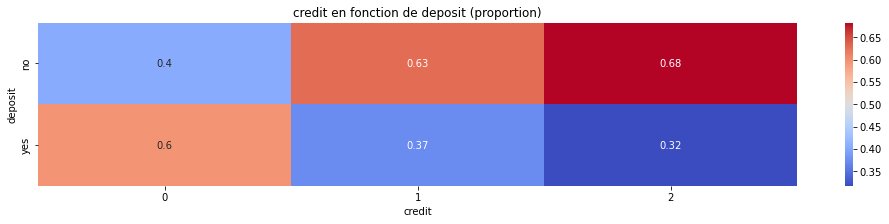

In [45]:
# nouvelle colonne comptant le nombre de crédit du client
df['credit'] = np.where((df['loan'] == 'yes'), 1, 0) + np.where((df['housing'] == 'yes'), 1, 0)
col_all(df['credit'].sort_values())

> Avoir deux crédits en cours réduit les chances de souscrire au DAT, mais l'écart n'est pas très significatif pour autant (avec un seul)

In [46]:
# les chiffres semblent similaire entre previous = 0 & pdays = -1, on vérifie cela
round(pd.crosstab(df['credit'], df['job'], normalize=1)*100,2)

job,admin.,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
credit,,,,,,,,,,,,
0,37.63,25.62,40.24,67.52,53.16,80.08,51.36,31.53,85.56,46.08,66.67,95.71
1,51.57,63.48,47.56,29.93,41.74,16.97,40.49,58.94,14.44,46.19,29.41,1.43
2,10.79,10.91,12.20,2.55,5.11,2.96,8.15,9.53,0.00,7.73,3.92,2.86


### Colonne contact

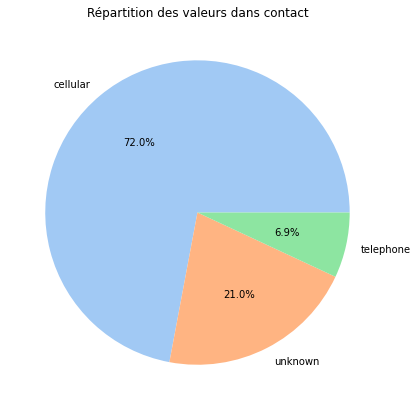

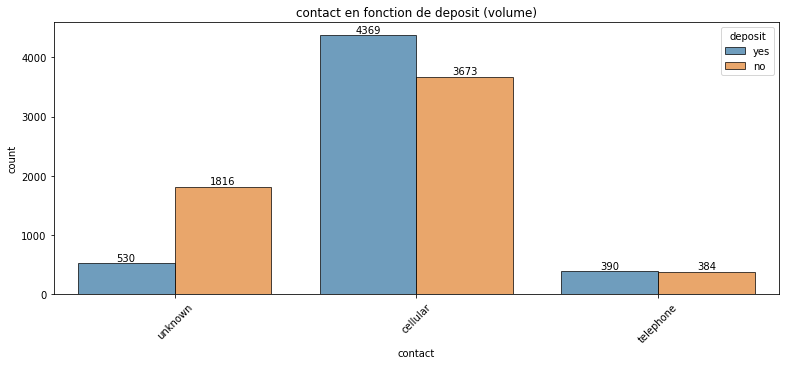

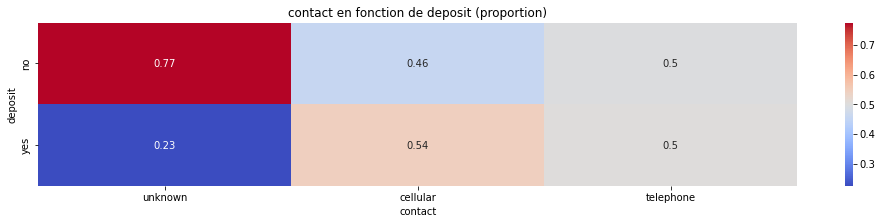

In [47]:
# info sur contact
col_all(df['contact']);

> Les résultats entre cellular et telephone sont très similaire. Il y a aussi peu de volume sur telephone. Il pourrait donc être intéressant de combiner les deux valeurs.

> Il y a beaucoup de valeur unknown et nous ne savons pas vraiment à quoi cela peut correspondre. Lorsque l'on contact un client, on sait si on a composé le numéro d'un portable ou d'un telephone fixe. Il est donc assez étonnant de voir la valeur contact = unknown. Nous pourrions donc simplement l'ignorer. Cependant, il y a un réél écart de résultat avec cellular et telephone, indiquant ainsi que ce n'est pas anodin. Dans un contexte profesionnel, nous aurions contacté la banque pour comprendre le process qui peut engendrer une valeur unknown pour la colonne contact.

### Colonne month

In [48]:
# on prèpare les mois dans l'ordre
sort_order = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']

# on créé un dataframe pour suivre le volume et le taux de réussite des appels par mois
mois_reussite = pd.crosstab(df['month'],df['deposit'])
mois_reussite['month'] = mois_reussite.index
mois_reussite['appel'] =mois_reussite['yes'] + mois_reussite['no'] 
mois_reussite['tx_reussite_par_mois'] = round((mois_reussite['yes'] / (mois_reussite['appel']))*100, 2)

# on réorganise l'index et on trie le datraframe dans l'ordre
mois_reussite.index = pd.CategoricalIndex(mois_reussite['month'], categories = sort_order, ordered = True)
mois_reussite = mois_reussite.sort_index().reset_index(drop = True)


# affichage du dataframe
mois_reussite

deposit,no,yes,month,appel,tx_reussite_par_mois
0,202,142,jan,344,41.28
1,335,441,feb,776,56.83
2,28,248,mar,276,89.86
3,346,577,apr,923,62.51
4,1899,925,may,2824,32.75
5,676,546,jun,1222,44.68
6,887,627,jul,1514,41.41
7,831,688,aug,1519,45.29
8,50,269,sep,319,84.33
9,69,323,oct,392,82.40


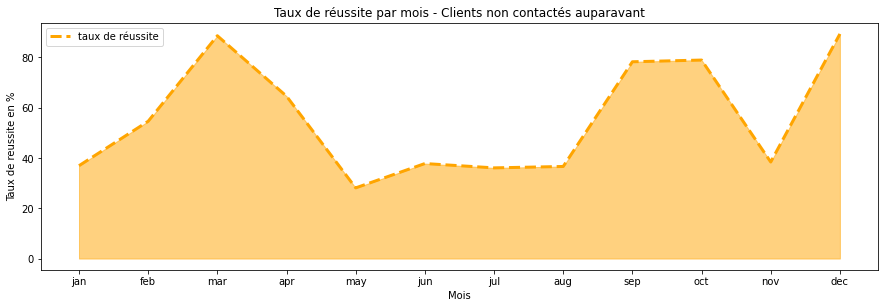

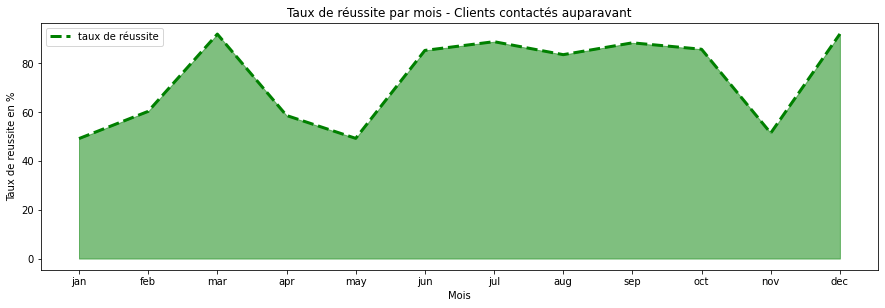

In [49]:
#analyses de la réussite des clients n'ayant pas été contacté auparavant
mois_reussite_previous_no = pd.crosstab(df_no_previous['month'],df_no_previous['deposit'])
mois_reussite_previous_no['month'] = mois_reussite_previous_no.index
mois_reussite_previous_no['appel'] = mois_reussite_previous_no['yes'] + mois_reussite_previous_no['no'] 
mois_reussite_previous_no['tx_reussite_par_mois'] = round((mois_reussite_previous_no['yes'] / (mois_reussite_previous_no['appel']))*100, 2)

mois_reussite_previous_no.index = pd.CategoricalIndex(mois_reussite_previous_no['month'], categories = sort_order, ordered = True)
mois_reussite_previous_no = mois_reussite_previous_no.sort_index().reset_index(drop = True)

#analyses de la réussite des clients ayant été contacté auparavant
mois_reussite_previous_yes = pd.crosstab(df_previous['month'],df_previous['deposit'])
mois_reussite_previous_yes['month'] = mois_reussite_previous_yes.index
mois_reussite_previous_yes['appel'] =mois_reussite_previous_yes['yes']+mois_reussite_previous_yes['no'] 
mois_reussite_previous_yes['tx_reussite_par_mois'] = round((mois_reussite_previous_yes['yes'] / (mois_reussite_previous_yes['appel']))*100, 2)

mois_reussite_previous_yes.index = pd.CategoricalIndex(mois_reussite_previous_yes['month'], categories = sort_order, ordered = True)
mois_reussite_previous_yes = mois_reussite_previous_yes.sort_index().reset_index(drop = True)

# graphs des deux cas
plt.figure(figsize=(15,10))
plt.subplot(2, 1, 1)
plt.plot(mois_reussite_previous_no['month'], 
         mois_reussite_previous_no['tx_reussite_par_mois'], 
         label ='taux de réussite', 
         color = 'orange', ls = '--',   linewidth = 3,  )
plt.fill_between(mois_reussite_previous_no['month'], mois_reussite_previous_no['tx_reussite_par_mois'], color='orange', alpha=0.5)
#plt.fill_between(mois_reussite['month'], mois_reussite['tx_reussite_par_mois'], np.max(mois_reussite['tx_reussite_par_mois']), alpha=0.5, color='red')
plt.xlabel('Mois')
plt.ylabel('Taux de reussite en %')
plt.title('Taux de réussite par mois - Clients non contactés auparavant')
plt.legend()
plt.show()

plt.figure(figsize=(15,10))
plt.subplot(2, 1, 2)
plt.plot(mois_reussite_previous_yes['month'], 
         mois_reussite_previous_yes['tx_reussite_par_mois'], 
         label ='taux de réussite', 
         color = 'green', ls = '--',   linewidth = 3,  )
plt.fill_between(mois_reussite_previous_yes['month'], mois_reussite_previous_yes['tx_reussite_par_mois'], color='green', alpha=0.5)
#plt.fill_between(mois_reussite['month'], mois_reussite['tx_reussite_par_mois'], np.max(mois_reussite['tx_reussite_par_mois']), alpha=0.5, color='red')
plt.xlabel('Mois')
plt.ylabel('Taux de reussite en %')
plt.title('Taux de réussite par mois - Clients contactés auparavant')
plt.legend()
plt.show();

> On voit que les mois les plus efficaces sont en mars, en septembre/octobre et décembre.
La période estivale n'est pas la meilleure période pour appeler les nouveaux clients.
Le mois de mai semble le pire. On va étudier les volumes d'appels par mois pour obtenir plus d'information.

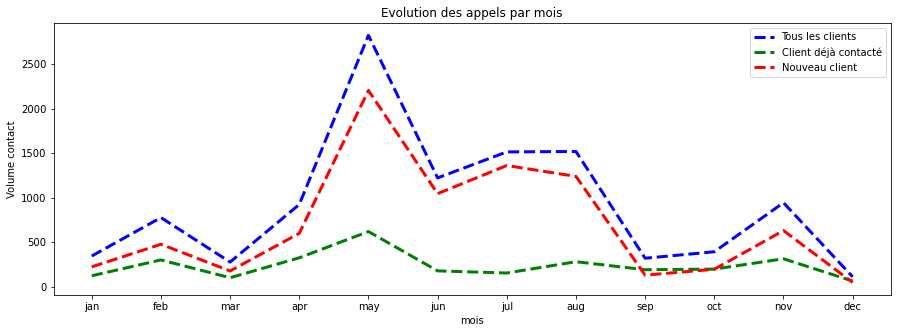

In [50]:
# graphique sur le volume d'appel
plt.figure(figsize=(15,5))
plt.plot(mois_reussite['month'], 
         mois_reussite['appel'], 
         label ='Tous les clients', 
         color = 'blue', ls = '--',   linewidth = 3)
plt.plot(mois_reussite_previous_yes['month'], 
         mois_reussite_previous_yes['appel'], 
         label ='Client déjà contacté', 
         color = 'green', ls = '--',   linewidth = 3)
plt.plot(mois_reussite_previous_no['month'], 
         mois_reussite_previous_no['appel'], 
         label ='Nouveau client', 
         color = 'red', ls = '--',   linewidth = 3)
plt.xlabel('mois')
plt.ylabel('Volume contact')
plt.title('Evolution des appels par mois')
plt.legend();

> On note que le volume d'appel est inversement proportionnel aux résultats vu avant. Le mois de mai ainsi que la période estivale montre un très fort volume d'appel, alors que nous avions un faible taux de succès.
A l'inverse, nous avons peu d'appels sur les mois efficaces comme mars ou décembre.
On peut imaginer qu'il y a eu des campagnes massives d'appels visant tous les clients lors des gros volumes, expliquant ainsi le faible taux de réussite. Pour les mois a faible volume, il n'y avait certainement pas de campagnes spécifique, on a pu donc contacté des clients bien précis ayant de forte de chance de souscrire.

In [51]:
# proportion de contact en fonction du mois
# mai et juin sont largement au dessus des autre pour la valeur unknown
round(pd.crosstab(df['contact'], df['month'], normalize=1),2).reindex(columns=sort_order)

month,jan,feb,mar,apr,may,jun,jul,aug,sep,oct,nov,dec
contact,,,,,,,,,,,,
cellular,0.89,0.89,0.89,0.93,0.46,0.31,0.85,0.96,0.87,0.78,0.89,0.82
telephone,0.11,0.10,0.09,0.07,0.04,0.02,0.12,0.04,0.10,0.17,0.09,0.17
unknown,0.00,0.01,0.01,0.01,0.50,0.66,0.03,0.01,0.03,0.05,0.02,0.01


### Colonne poutcome

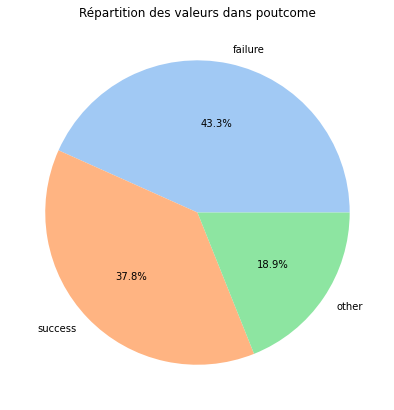

In [52]:
# distribution de poutcome sans unknown
poutcome_not_na = df[df['poutcome'] != 'unknown']
col_pie(poutcome_not_na['poutcome'])

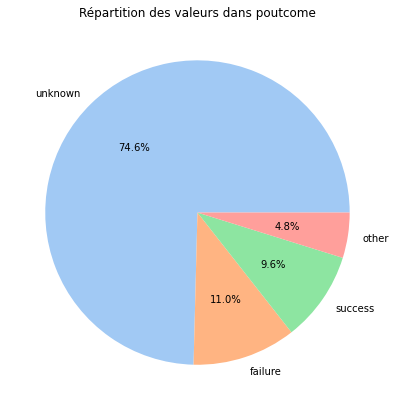

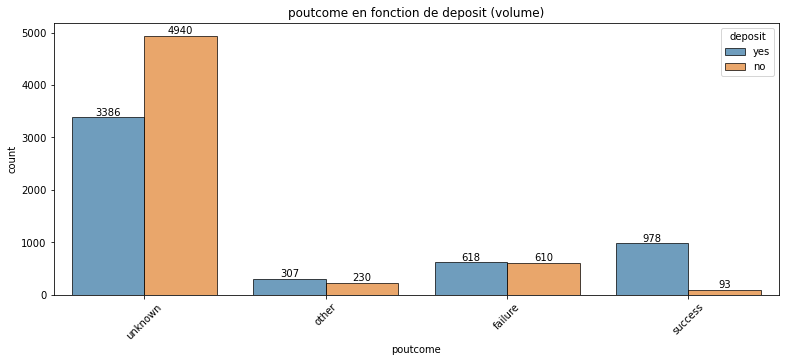

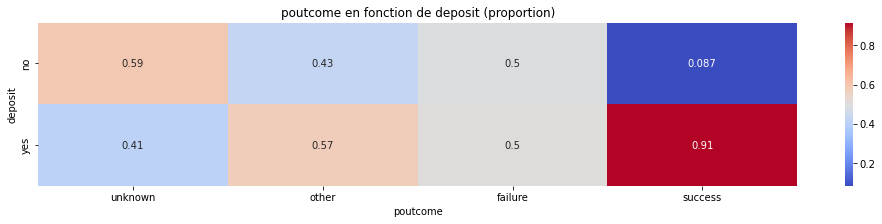

In [53]:
# info sur poutcome
col_all(df['poutcome']);

> Il y a énormément d'unknown. Cela correspond à tous les nouveaux clients. C'est logique, nous ne pouvons pas avoir de résultat précédent, sur une personne que nous n'avons jamais appelé. Unknown correspond donc à previous = 0 ou pdays = -1

> Success correspond aux clients ayant dit oui lors d'une précédente campagne. Le taux d'acceptation est très élevé pour ces clients.

> Failure et other sont assez proche. Failure correspond à un refus du client lors de la précédente campagne. Other correpond a un client qui a fait un retour positif mais un autre service que le DAT. On pourra envisager de regriyoer other et faillure, car les volumes sont très faibles.

In [54]:
df['has_previous'] = df['previous'] > 0
# Vérification de la logique entre client jamais contacté et poutcome unknown 
pd.crosstab(df['has_previous'], df['poutcome'])

poutcome,failure,other,success,unknown
has_previous,,,,
False,0,0,0,8324
True,1228,537,1071,2


> On constate que toutes les lignes sont cohérentes sauf 2 (unknown et previous > 0). Nous pourrons donc supprimer ces deux lignes lors de la phase de preprocessing.

In [55]:
# suppression des deux lignes
df = df[(df['poutcome'] != 'unknown') | (df['previous'] == 0)]

# Refaire un check rapide en distinguant les nouveaux et anciens clients

## Check de campaign en comparant les nouveaux clients et les anciens

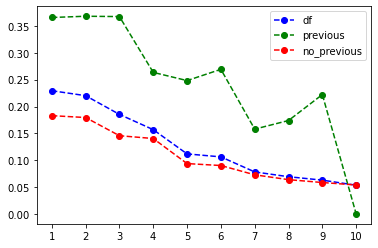

In [56]:
prop_campaign = []
prop_previous = []
prop_no_previous = []
# création de 10 nouvelles colonnes campaign pour véritablement voir les résultats en fonction de l'appel
for i in range(1,11):
    new_col = 'campaign_' + str(i)
    # on créé une colonne, est vrai si campaign est supérieur à i
    df[new_col] = df['campaign'] >= i
    df_previous[new_col] = df_previous['campaign'] >= i
    df_no_previous[new_col] = df_no_previous['campaign'] >= i
    # Pour chaque nouvelle colonne campaign, on récupère la proportion d'acceptation
    prop_campaign.append(((df['campaign'] == i) & (df['deposit'] == 'yes')).sum() / (df[new_col] == True).sum())
    prop_previous.append(((df_previous['campaign'] == i) & (df_previous['deposit'] == 'yes')).sum() / (df_previous[new_col] == True).sum())
    prop_no_previous.append(((df_no_previous['campaign'] == i) & (df_no_previous['deposit'] == 'yes')).sum() / (df_no_previous[new_col] == True).sum())
    
    
# affichage des proportions totales et en fonction de previous
x = range(1,11)
plt.plot(x, prop_campaign, 'o--', c='blue', label='df')
plt.plot(x, prop_previous, 'o--', c='green', label='previous')
plt.plot(x, prop_no_previous, 'o--', c='red', label='no_previous')
plt.xticks(x)
plt.legend();

### Montrer l'existence de "faux doublons", semble être un même client mais à des dates différentes

In [57]:
# exemple 1
data.sort_values('balance').tail(2)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
3043,84,retired,married,secondary,no,81204,no,no,telephone,28,dec,679,1,313,2,other,yes
3380,84,retired,married,secondary,no,81204,no,no,telephone,1,apr,390,1,94,3,success,yes


In [58]:
# exemple 2
data[data['balance']> 27695].sort_values(['balance', 'previous']).head(4)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
2495,41,management,married,tertiary,no,27696,no,no,cellular,12,aug,147,2,104,1,failure,yes
3213,41,management,married,tertiary,no,27696,no,no,cellular,12,feb,138,2,184,3,success,yes
5092,42,management,married,tertiary,no,27696,no,no,cellular,12,may,176,2,89,5,success,yes
3870,42,management,married,tertiary,no,27696,no,no,cellular,11,aug,370,1,91,7,success,yes


## Pré-processing, features engineering simple : 
Avant d'entamer des recherches de corrélation il est important de procéder à un préprocessing dans lequel il sera question du choix des features à garder et des diverses opérations de combinaisons de variable à opérer.
Comme nous l'avons vu précédemment les premières étapes seront : 
- Suppression de la variable 'duration'
- Suppression de la variable 'campaign'
- Eliminer les lignes pour lequelles 'poutcome' != 'unknown' et 'previous' == 0

In [59]:
df_1 = data.copy()

# Suppresion de 'duration' & 'campaign'
df_1 = df_1.drop('duration', axis = 1)
df_1 = df_1.drop('campaign', axis = 1)

# Suppresion des 2 lignes incohérentes : 
df_1 = df_1[(df_1['poutcome'] != 'unknown') | (df_1['previous'] == 0)]

# Visualisation du dataset df_1 :
df_1.head(5)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,-1,0,unknown,yes


## Tests Statistiques avec la valeur cible 'deposit': 
En Data science, il est primordial de découvrir et quantifier à quel point deux variables sont liées. Ces relations peuvent être complexes et ne sont pas forcément visibles. Or certaines de ces dépendances affaiblissent les performances d’algorithme de Machine Learning comme des régressions linéaires. Il devient alors impératif de mieux préparer nos données.
Un test statistique est une procédure de décision entre deux hypothèses.
Il s’agit d’une démarche consistant à rejeter ou à ne pas rejeter une hypothèse statistique, appelée hypothèse nulle H0, en fonction d’un jeu de données.

#### Analyse des variables catégorielles à l'aide du test du 𝜒2
Pour savoir si deux variables catégorielles sont liées, on utilise le test du khi-deux

Dans le test qui nous intéresse l’hypothèse nulle H0 est simplement « les deux variables testées sont indépendantes ». Enfin le test s’accompagne d’une statistique de test qui participe à la décision de rejeter ou non H0. Cette statistique par la manière dont le test est construit, a le bon goût de suivre une loi de khi-deux avec un certain degré de liberté

Mais comment décider de rejeter ou non l’hypothèse nulle ? <br>
Chaque test statistique dispose de ce qu’on appelle la p-value. On peut la voir comme une valeur référence pour décider du rejet ou non de l’hypothèse nulle. Si cette dernière est en-dessous de 5% alors on rejette l’hypothèse nulle.

Enfin on peut également mesurer le niveau de corrélation entre les deux variables en utilisant le V de Cramer. Il se calcule à l’aide de la statistique de test (Chi2), du degré de liberté (DoF) et des dimensions de la table de contingence. Il renvoie une valeur entre 0 et 1. Si la valeur est renvoyée est supérieure à 0.9 on peut qualifier la relation de très forte. Si la valeur est inférieure à 0.10 on peut qualifier la relation de faible.
Le tableau ci-dessous nous donne les informations suivantes : 

- statistique du test, 
- p-value,
- degré de liberté, 
- V de Cramer (coefficient de corrélation du 𝜒2)


In [60]:
from scipy.stats import chi2_contingency
df_1_cat = df_1.select_dtypes('object')
def V_Cramer(table, N):
    stat_chi2 = chi2_contingency(table)[0]
    k = table.shape[0]
    r = table.shape[1]
    phi_2 = max(0,(stat_chi2)/N - ((k - 1)*(r - 1)/(N - 1)))
    k_b = k - (np.square(k - 1) / (N - 1))
    r_b = r - (np.square(r - 1) / (N - 1))   
    return np.sqrt(phi_2 / min(k_b - 1, r_b - 1))

dico = {}
for col in df_1_cat.columns:
    table = pd.crosstab(df_1_cat[col], df_1['deposit'])
    res = chi2_contingency(table)
    dico[col] = [res[0], res[1], res[2], V_Cramer(table, df_1.shape[0])]
    
    
stats = pd.DataFrame.from_dict(dico).transpose()
stats = stats.rename(columns={0:'chi 2', 1:'p-value', 2:'DoF', 3:'V de Cramer'})
stats

,chi 2,p-value,DoF,V de Cramer
job,377.431711,3.753624e-74,11.0,0.181210
marital,109.486520,1.679981e-24,2.0,0.098144
education,122.621316,2.103014e-26,3.0,0.103536
default,17.788165,2.469144e-05,1.0,0.038787
housing,463.328156,9.070532e-103,1.0,0.203546
loan,136.427638,1.608706e-31,1.0,0.110164
contact,736.153834,1.400316e-160,2.0,0.256496
month,1045.899815,2.533382e-217,11.0,0.304534
poutcome,1005.259133,1.300958e-217,3.0,0.299693
deposit,11155.989301,0.000000e+00,1.0,0.999820


les p-values sont toutes sous la barre des 5%, on rejette donc l'hypothèse nulle H0.
De même, le V de Cramer présente des valeurs insuffisantes notamment pour les variables 'marital', 'default'

#### Analyse des variables numériques à l'aide du test ANOVA

Une ANOVA ("analyse de variance") est utilisée pour déterminer si oui ou non les moyennes de trois groupes indépendants ou plus sont égales.

Une ANOVA utilise les hypothèses nulles et alternatives suivantes :

- H0 : Toutes les moyennes de groupe sont égales.
- HA : Au moins une moyenne de groupe est différente des autres.

Deux valeurs que nous analysons immédiatement dans le tableau sont la statistique F et la valeur p correspondante .

__Comprendre la statistique F dans ANOVA__<br>
La statistique F est le rapport du traitement des carrés moyens à l'erreur des carrés moyens :

Statistique F : traitement des carrés moyens / erreur des carrés moyens
En d'autres termes : 
Statistique F : Variation entre les moyennes des échantillons / Variation au sein des échantillons
Plus la statistique F est élevée, plus la variation entre les moyennes des échantillons est grande par rapport à la variation au sein des échantillons.

Ainsi, plus la statistique F est élevée, plus la preuve qu'il existe une différence entre les moyennes des groupes est grande.

__Comprendre la valeur P dans ANOVA__<br>
Si cette valeur de p est inférieure à α = 0,05, nous rejetons l'hypothèse nulle de l'ANOVA et concluons qu'il existe une différence statistiquement significative entre les moyennes des trois groupes.
Sinon, si la valeur de p n'est pas inférieure à α = 0,05, nous ne rejetons pas l'hypothèse nulle et concluons que nous n'avons pas suffisamment de preuves pour dire qu'il existe une différence statistiquement significative entre les moyennes des trois groupes.

#### ANOVA : 'age' / 'deposit'

In [61]:
import statsmodels.api
result = statsmodels.formula.api.ols('age ~ deposit', data=df_1).fit()
table1 = statsmodels.api.stats.anova_lm(result)
table1

C:\Users\jonat\Documents\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
C:\Users\jonat\Documents\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


,df,sum_sq,mean_sq,F,PR(>F)
deposit,1.0,1.925916e+03,1925.916401,13.587852,0.000229
Residual,11158.0,1.581514e+06,141.738105,NaN,NaN


#### ANOVA : 'balance' / 'deposit'

In [62]:
result = statsmodels.formula.api.ols('balance ~ deposit', data=df_1).fit()
table2 = statsmodels.api.stats.anova_lm(result)
table2

,df,sum_sq,mean_sq,F,PR(>F)
deposit,1.0,7.641457e+08,7.641457e+08,73.92161,9.212031e-18
Residual,11158.0,1.153430e+11,1.033724e+07,NaN,NaN


#### ANOVA : 'days' / 'deposit'

In [63]:
result = statsmodels.formula.api.ols('day ~ deposit', data=df_1).fit()
table3 = statsmodels.api.stats.anova_lm(result)
table3

,df,sum_sq,mean_sq,F,PR(>F)
deposit,1.0,2515.024141,2515.024141,35.584154,2.516763e-09
Residual,11158.0,788627.413135,70.678205,NaN,NaN


#### ANOVA : 'pdays' / 'deposit'

In [64]:
result = statsmodels.formula.api.ols('pdays ~ deposit', data=df_1).fit()
table4 = statsmodels.api.stats.anova_lm(result)
table4

,df,sum_sq,mean_sq,F,PR(>F)
deposit,1.0,3.028009e+06,3.028009e+06,261.977062,2.925198e-58
Residual,11158.0,1.289675e+08,1.155830e+04,NaN,NaN


#### ANOVA : 'previous' / 'deposit'

In [65]:
result = statsmodels.formula.api.ols('previous ~ deposit', data=df_1).fit()
table5 = statsmodels.api.stats.anova_lm(result)
table5

,df,sum_sq,mean_sq,F,PR(>F)
deposit,1.0,1146.333971,1146.333971,222.509262,7.740962e-50
Residual,11158.0,57484.323735,5.151848,NaN,NaN


In [66]:
data_anova = {'F':[13.587852,73.92161, 35.584154, 261.977062, 222.509262],
        'PR(>F)':[0.000229,9.212031e-18,2.516763e-09,2.925198e-58,7.740962e-50]}
df_anova = pd.DataFrame(data_anova, index=['age','balance','days','pdays','previous'])
df_anova

,F,PR(>F)
age,13.587852,2.290000e-04
balance,73.921610,9.212031e-18
days,35.584154,2.516763e-09
pdays,261.977062,2.925198e-58
previous,222.509262,7.740962e-50


Les p-values sont toutes sous la barre des 5%, on rejette donc l'hypothèse nulle H0, de même, le V de Cramer présente des valeurs insuffisantes pour les variables la plupart des variables, on peut en conclure qu’il est difficile de mettre en évidence des features indispensables.

### Correlation entre variables catégoriques : 

In [67]:
# Création d'un dataframe avec les variables catégoriques :
df_1_cat = df_1.select_dtypes('object')
df_1_cat.columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'poutcome', 'deposit'],
      dtype='object')

In [68]:
df_1_cat.columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'poutcome', 'deposit'],
      dtype='object')

In [69]:
from itertools import product

# Création d'un dataframe avec les variables catégoriques :
df_1_cat = df_1.select_dtypes('object')
df_1_cat.columns
# Split de df_1_cat en 2 parties : 
df_1_cat_var1 = ('job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome', 'deposit')

#  Chi-2 Test :
## Création de toutes les combinaison Creating all possible combinations between the above two variables list
cat_var_prod = list(product(df_1_cat_var1,df_1_cat_var1, repeat = 1))


In [70]:
## Création d'une liste result et la remplir avec les p values issues du chi2 test : 
import scipy.stats as ss

result = []
for i in cat_var_prod:
    if i[0] != i[1]:
        result.append((i[0],i[1],list(ss.chi2_contingency(pd.crosstab(df_1_cat[i[0]], df_1_cat[i[1]])))[1]))

In [71]:
chi_test_output = pd.DataFrame(result, columns = ['var1', 'var2', 'coeff'])
## Using pivot function to convert the above DataFrame into a crosstab
chi_test_output.pivot(index='var1', columns='var2', values='coeff')

var2,contact,default,deposit,education,housing,job,loan,marital,month,poutcome
var1,,,,,,,,,,
contact,NaN,8.362571e-06,1.400316e-160,1.178000e-79,3.410832e-165,6.135021e-145,5.691110e-02,5.099734e-17,0.000000e+00,1.010777e-204
default,8.362571e-06,NaN,2.469144e-05,3.615903e-01,2.746424e-01,1.129952e-03,1.661901e-15,1.151895e-01,6.897508e-07,2.191789e-07
deposit,1.400316e-160,2.469144e-05,NaN,2.103014e-26,9.070532e-103,3.753624e-74,1.608706e-31,1.679981e-24,2.533382e-217,1.300958e-217
education,1.178000e-79,3.615903e-01,2.103014e-26,NaN,9.736984e-46,0.000000e+00,4.029692e-21,1.561932e-72,7.310391e-56,9.805216e-14
housing,3.410832e-165,2.746424e-01,9.070532e-103,9.736984e-46,NaN,3.979158e-224,7.954876e-16,2.278903e-05,0.000000e+00,1.624591e-57
job,6.135021e-145,1.129952e-03,3.753624e-74,0.000000e+00,3.979158e-224,NaN,5.814549e-40,9.031366e-252,4.289094e-215,4.936392e-37
loan,5.691110e-02,1.661901e-15,1.608706e-31,4.029692e-21,7.954876e-16,5.814549e-40,NaN,2.755155e-11,9.668888e-73,3.209085e-17
marital,5.099734e-17,1.151895e-01,1.679981e-24,1.561932e-72,2.278903e-05,9.031366e-252,2.755155e-11,NaN,8.846717e-14,1.627021e-05
month,0.000000e+00,6.897508e-07,2.533382e-217,7.310391e-56,0.000000e+00,4.289094e-215,9.668888e-73,8.846717e-14,NaN,1.842919e-226


<AxesSubplot:xlabel='var2', ylabel='var1'>

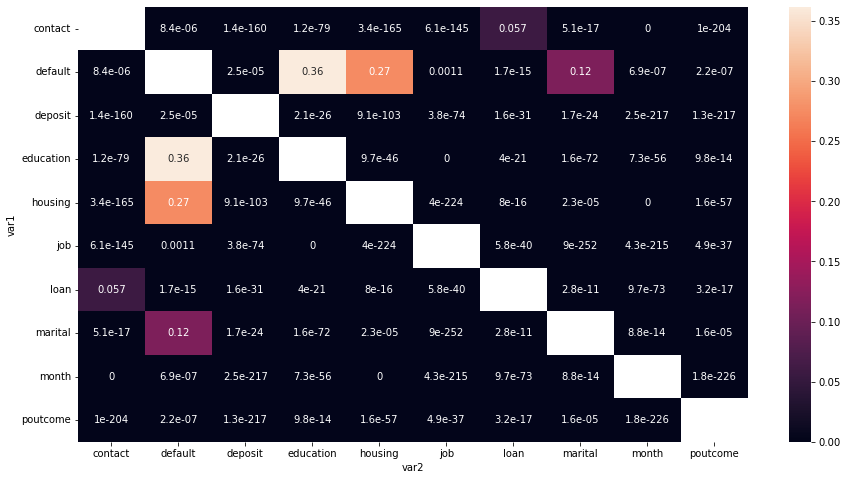

In [72]:
# Heatmap : 
plt.figure(figsize=(15,8))
sns.heatmap(chi_test_output.pivot(index='var1', columns='var2', values='coeff'), annot=True)

Conclusions : 
Pour rappel : Chaque test statistique dispose de ce qu’on appelle la p-value. On peut la voir comme une valeur référence pour décider du rejet ou non de l’hypothèse nulle. Si cette dernière est en-dessous de 5% alors on rejette l’hypothèse nulle (« les deux variables testées sont indépendantes »)
Ici p-value > 0,05 pour les variables suivantes : 
- 'education' / 'default'
- 'education' / 'housing'
- 'loan' / 'contact'
- 'marital' / 'defaut' <br>

Ces variables sont indépendantes



### Correlation entre valeurs numériques 
Le coefficient de Pearson est un indice reflétant une relation linéaire entre deux variables continues. Le coefficient de corrélation varie entre -1 et +1, 0 reflétant une relation nulle entre les deux variables, une valeur négative (corrélation négative) signifiant que lorsqu'une des variable augmente, l'autre diminue ; tandis qu'une valeur positive (corrélation positive) indique que les deux variables varient ensemble dans le même sens.
La valeur de r obtenue est une estimation de la corrélation entre deux variables continues dans la population. Dès lors, sa valeur fluctuera d'un échantillon à l'autre. On veut donc savoir si, dans la population ces deux variables sont réellement corrélées ou pas. On doit donc réaliser un test d'hypothèse.

H0: Pas de corrélation entre les deux variables : ρ = 0 <br>
HA: Corrélation entre les deux variables : ρ ≠ 0

Faisons apparaitre la heatmap des corrélations entre les valeurs numériques : 

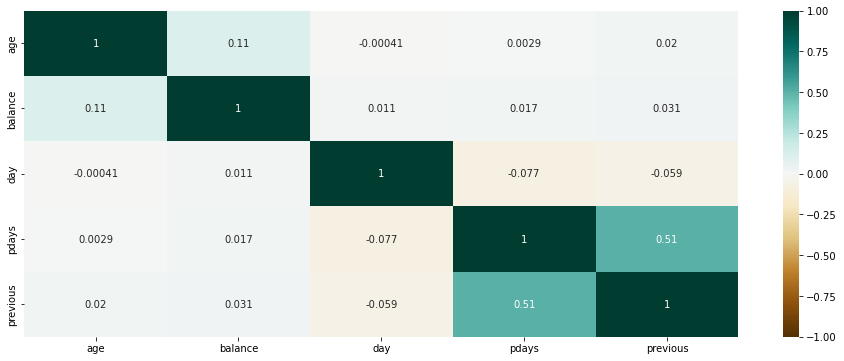

In [73]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(df_1.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')

### Correlation entre valeurs catégoriques : test de Kendall
le tau de Kendall est une statistique qui mesure l’association entre deux variables.
Plus spécifiquement, le tau de Kendall mesure la corrélation de rang entre deux variables.
Le tau s’interprête de la même façon que les autres coeffcients de corrélation. Sa valeur est comprise entre -1 et 1 : s’il s’approche de 1, on peut supposer l’existence d’une corrélation positive (variation dans le même sens), s’il tend vers -1, on peut dire qu’il existe une corrélation négative et si le tau est proche de 0, il est fort probable qu’il n’y ait aucune liaison entre les 2 variables. 
#### Kendall 'balance' / 'job' 


In [74]:
from scipy.stats import kendalltau

corr, _ = kendalltau(df_1['balance'], df_1['job'])
print('Coefficient de corrélation Kendall : %.5f' % corr)

Coefficient de corrélation Kendall : 0.03460


#### Kendall 'day' / 'month' 


In [75]:
corr, _ = kendalltau(df_1['day'], df_1['month'])
print('Coefficient de corrélation Kendall : %.5f' % corr)

Coefficient de corrélation Kendall : -0.00250


Grande probabilité qu'il n'y ait aucune liaison entre les variables 

# On repart sur un df propre pour commencer le pre-processing

In [76]:
# Manipulation données
from sklearn.model_selection import cross_validate, train_test_split, GridSearchCV, learning_curve

# Scaler
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, PolynomialFeatures

# Classifiers
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB

# Scoring
from sklearn.metrics import classification_report
from sklearn.metrics import auc, roc_auc_score, confusion_matrix, f1_score
from sklearn.metrics import precision_score, recall_score, make_scorer ,roc_curve
import sklearn.metrics as metrics

In [77]:
# on récupère le Dataframe initial
df = data.copy()

# drop des deux lignes incohérentes du dataset
df = df[(df['poutcome'] != 'unknown') | (df['previous'] == 0)]

# on supprime les colonnes qui sont connus après les appels
df = df.drop(['duration'], axis=1)
df = df.drop(['campaign'], axis=1) 

In [78]:
# on découpe le dataframe en 2, un trainset et un testset
trainset, testset = train_test_split(df, test_size=0.2, random_state=0)

In [79]:
# affichage du trainset
trainset

,age,job,marital,education,default,balance,housing,loan,contact,day,month,pdays,previous,poutcome,deposit
6978,48,blue-collar,married,primary,no,430,no,no,cellular,14,may,371,8,failure,no
1149,59,retired,divorced,secondary,no,514,no,no,cellular,3,feb,-1,0,unknown,yes
6316,33,technician,married,secondary,no,3071,yes,yes,cellular,21,jul,-1,0,unknown,no
2457,42,services,single,secondary,no,3403,yes,no,cellular,7,aug,99,1,failure,yes
6610,36,admin.,single,secondary,no,191,yes,no,cellular,25,jul,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4860,33,services,single,unknown,no,2297,no,no,cellular,27,jul,-1,0,unknown,yes
3265,60,admin.,married,secondary,no,106,no,no,cellular,24,feb,187,4,success,yes
9847,23,student,single,tertiary,no,82,no,no,cellular,4,may,-1,0,unknown,no
10801,28,admin.,single,tertiary,no,373,yes,no,cellular,4,feb,-1,0,unknown,no


# Faire le pre-processing, données dans un format propice au ML

In [80]:
def encodage(df):
    
    # gestion des valeurs binaire, oui/non ; vrai/faux
    # deposit, loan, housing....
    # on définit un mapping
    code = {'yes':1,
            True:1,
            'no':0,
            False:0}
    
    # on l'applique pour les boolean
    for col in df.select_dtypes('boolean').columns:
        df[col] = df[col].map(code)  
    
    # on l'applique pour les object à deux valeurs uniques
    for col in df.select_dtypes('object').columns:
        if (len(df[col].unique()) == 2):
            df[col] = df[col].map(code)
            df[col] = df[col].astype('uint8')
            
    # création de dummy variable pour les colonnes ayant plus de deux variables comme job, marital, poutcome...
    col_categoric = df.select_dtypes(['object', 'category']).columns
    df = df.join(pd.get_dummies(df[col_categoric], prefix=col_categoric))
    # on supprime les anciennes colonnes
    df = df.drop(col_categoric, axis=1)
    
    return df

In [81]:
def feature_scaling(df, is_testset):
    
    # scaler numeric
    col_numeric = df.select_dtypes(['int64']).columns
    
    # On scale les données sur le trainset
    # Si trainset
    if is_testset == False:
        df[col_numeric] = scaler.fit_transform(df[col_numeric])
    # Si nouvelle données / testset
    if is_testset == True:
        df[col_numeric] = scaler.transform(df[col_numeric])
    
    return df

In [82]:
# appelle les fonctiones précédentes
# un Dataframe et un boolean (si trainset : false, si autres true)
def preprocessing(df, is_testset):
    
    df = encodage(df)
    df = feature_scaling(df, is_testset)
    
    X = df.drop('deposit', axis=1)
    y = df['deposit']
    
    return X, y

In [83]:
# on fait une copie des données
train = trainset.copy()
test = testset.copy()

# scaler qui sera appliqué avec la fonction feature_scaling
scaler = MinMaxScaler((0,1))

# on applique la fonction de preprocessing pour générer X_train, y_train etc
X_train, y_train = preprocessing(df=train, is_testset=False)
X_test, y_test = preprocessing(df=test, is_testset=True)

In [84]:
# affichage de X_train
X_train

,age,default,balance,housing,loan,day,pdays,previous,job_admin.,job_blue-collar,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
6978,0.389610,0,0.099007,0,0,0.433333,0.435088,0.137931,0,1,...,0,0,1,0,0,0,1,0,0,0
1149,0.532468,0,0.100150,0,0,0.066667,0.000000,0.000000,0,0,...,0,0,0,0,0,0,0,0,0,1
6316,0.194805,0,0.134939,1,1,0.666667,0.000000,0.000000,0,0,...,0,0,0,0,0,0,0,0,0,1
2457,0.311688,0,0.139456,1,0,0.200000,0.116959,0.017241,0,0,...,0,0,0,0,0,0,1,0,0,0
6610,0.233766,0,0.095755,1,0,0.800000,0.000000,0.000000,1,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4860,0.194805,0,0.124408,0,0,0.866667,0.000000,0.000000,0,0,...,0,0,0,0,0,0,0,0,0,1
3265,0.545455,0,0.094599,0,0,0.766667,0.219883,0.068966,1,0,...,0,0,0,0,0,0,0,0,1,0
9847,0.064935,0,0.094272,0,0,0.100000,0.000000,0.000000,0,0,...,0,0,1,0,0,0,0,0,0,1
10801,0.129870,0,0.098231,1,0,0.100000,0.000000,0.000000,1,0,...,0,0,0,0,0,0,0,0,0,1


In [85]:
# répartition de deposit dans y_train
round(y_train.value_counts(normalize=True),3)

0    0.525
1    0.475
Name: deposit, dtype: float64

## PCA

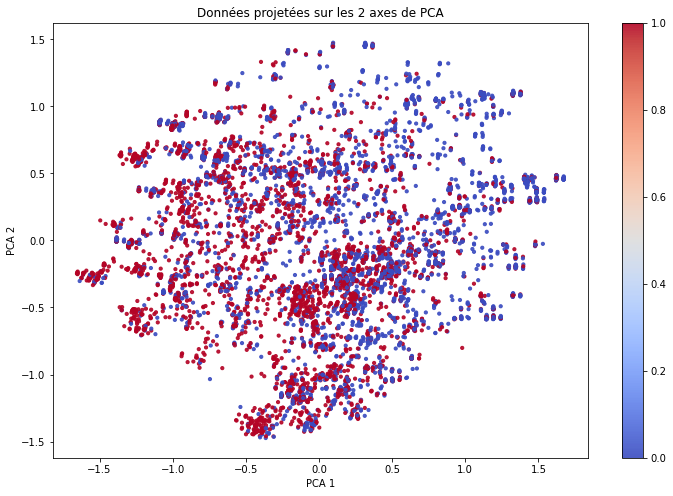

La part de variance expliquée est 0.24


In [86]:
from sklearn.manifold import Isomap, TSNE
from sklearn.decomposition import PCA


# mise en place d'un pca
pca = PCA(2)
X_train_pca = pca.fit_transform(X_train)

# création de figure
plt.figure(figsize=(12,8))

# données
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='coolwarm', s=10, alpha=0.9)
plt.colorbar()

# légende / info
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title("Données projetées sur les 2 axes de PCA")
plt.show();

print("La part de variance expliquée est", round(pca.explained_variance_ratio_.sum(),2))

## Isomap

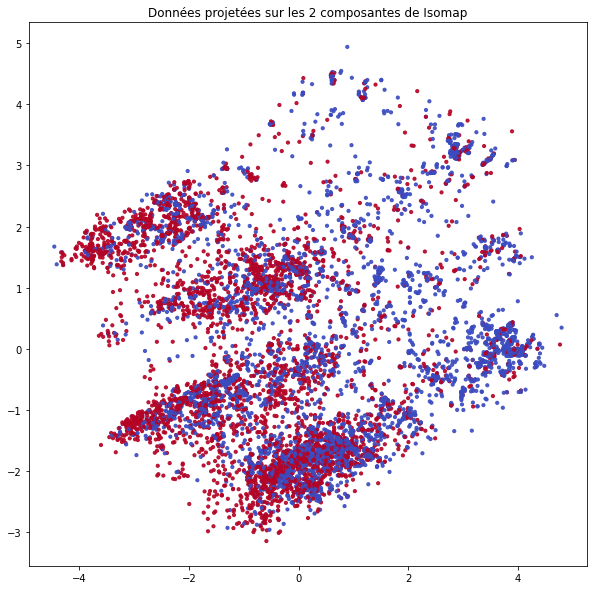

In [87]:
# création d'un isomap

isomap = Isomap(n_neighbors=50)
X_train_ISO = isomap.fit_transform(X_train)

# figure
fig = plt.figure(figsize=(10,10))

ax = fig.add_subplot(111)
ax.scatter(X_train_ISO[:, 0], X_train_ISO[:, 1],  c = y_train, cmap='coolwarm', alpha = .9, s = 10)

ax.set_title("Données projetées sur les 2 composantes de Isomap")
plt.show();

## TNSE

C:\Users\jonat\Documents\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\jonat\Documents\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


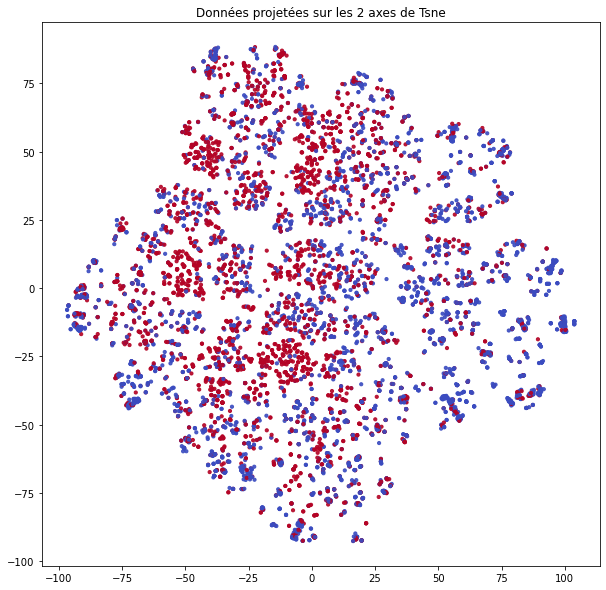

In [88]:
# création d'un TNSE

tsne = TSNE(method = 'barnes_hut', random_state=0)
X_train_TSNE = tsne.fit_transform(X_train)

# figure
fig = plt.figure(figsize=(10,10))

ax = fig.add_subplot(111)
ax.scatter(X_train_TSNE[:, 0], X_train_TSNE[:, 1],  c = y_train, cmap='coolwarm', alpha = .9, s = 10)

ax.set_title("Données projetées sur les 2 axes de Tsne")
plt.show();

## Création de modèle simple

In [89]:
# on repart sur les données de base
train = trainset.copy()
test = testset.copy()

# nouveau scaler à appliquer (meilleur pour le SVM)
scaler = StandardScaler()

# on applique le preprocessing
X_train, y_train = preprocessing(df=train, is_testset=False)
X_test, y_test = preprocessing(df=test, is_testset=True)

# création de plusieurs modèle

# Logistic Regression
LR_clf= LogisticRegression(random_state=0, max_iter=1000)

# SGD classifier
sgd_clf = SGDClassifier(random_state=0)

# LinearSVC 
lsvc_clf = LinearSVC(random_state=0)

# Decision Tree
DTC_clf = DecisionTreeClassifier(random_state=0)

# Random Forest
RF_clf = RandomForestClassifier(random_state=0)

# Naive Bayes
nb_clf = GaussianNB()

# K-Nearest Neighbors - KNN
Knn_clf = KNeighborsClassifier()

# Adaboost Classifier
Ada_clf = AdaBoostClassifier(random_state=0)

# Bagging Classifier 
bag_clf = BaggingClassifier(random_state=0)

# SVM classifier
svm_clf = SVC(random_state=0, probability=True)


classifiers = [('Decision Tree Classifier',DTC_clf), 
               ('Logistic Regression Classifier',LR_clf),
               ('Random Forest Classifier',RF_clf),
               ('AdaBoost Classifier',Ada_clf),
               ('Bagging Classifier',bag_clf),
               ('KNN Classifier', Knn_clf), 
               ('Naive Bayes', nb_clf),
               ('SVM Classifier', svm_clf),
               ('SGD Classifier', sgd_clf),
               ('Linear SVC', lsvc_clf)
              ]
# on créé un dataframe pour accueillir les résultats
models_scores_standard_scaler = pd.DataFrame(columns= ['Decision Tree Classifier',
                                             'SGD Classifier',
                                             'Linear SVC',
                                            'Logistic Regression Classifier',
                                            'Random Forest Classifier', 
                                            'AdaBoost Classifier', 
                                            'Bagging Classifier', 
                                            'KNN Classifier', 
                                            'Naive Bayes',
                                            'SVM Classifier'
                                            ],
                                   index=   ['Accuracy', 'Precision', 'Recall', 'F1','Roc_auc']
                                  )
# pour chaque modèle 
for clf_name, clf in classifiers:
    
    # on fait une cross validation sur les 5 métriques
    scores = cross_validate(clf, X_train, y_train,
                            scoring=['accuracy', 'precision', 'recall', 'f1', 'roc_auc'], 
                            cv=4, n_jobs=-1)
    
    # on enregistre la moyenne des score dans le dataframe
    models_scores_standard_scaler[clf_name] = [scores['test_accuracy'].mean(),
                                     scores['test_precision'].mean(),
                                     scores['test_recall'].mean(),
                                     scores['test_f1'].mean(),
                                     scores['test_roc_auc'].mean()]

# on affiche les résultats, en vers les meilleurs score
table = models_scores_standard_scaler
table.style.highlight_max(color = 'lightgreen', axis = 1)

,Decision Tree Classifier,SGD Classifier,Linear SVC,Logistic Regression Classifier,Random Forest Classifier,AdaBoost Classifier,Bagging Classifier,KNN Classifier,Naive Bayes,SVM Classifier
Accuracy,0.641241,0.684364,0.698365,0.701165,0.718414,0.708109,0.698589,0.679323,0.673163,0.731855
Precision,0.623936,0.702104,0.735260,0.736106,0.729368,0.737446,0.719586,0.685596,0.755723,0.788232
Recall,0.615241,0.600832,0.570179,0.577965,0.647089,0.599433,0.598490,0.599906,0.460722,0.595424
F1,0.619487,0.641555,0.642214,0.647472,0.685718,0.661060,0.653466,0.639853,0.572411,0.678345
Roc_auc,0.639995,0.739381,0.757826,0.758460,0.775206,0.768568,0.751998,0.719771,0.732291,0.780861


> Les 2 meilleurs modèles en se basant sur le Roc_auc sont Random Forest, SVM. C'est également ces 2 modèles qui obtiennent le meilleur score dans au moins l'une des métriques choisi précédement.

> Pour le moment, nos modèles sont simples et nous n'avons pas effectué un preprocessing complexe. Nous allons nous concentrer sur ces 2 modèles par la suite.

### Learning Curve

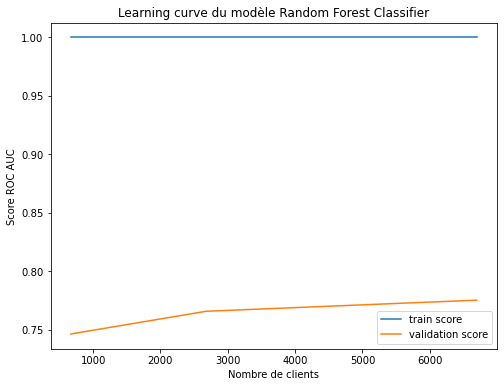

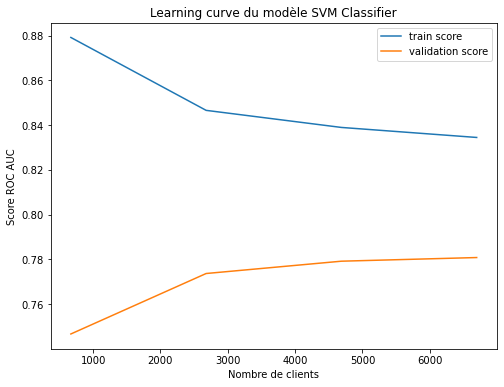

In [90]:
# on fait une learning curve pour les deux modèles avec du vert
# on s'assure d'avoir assez de données
for clf_name, clf in [('Random Forest Classifier',RF_clf),  ('SVM Classifier', svm_clf)]:
    
    # calcul de la learning curve
    N, train_score, val_score = learning_curve(clf, X_train, y_train, 
                                               cv=4, scoring='roc_auc', random_state=0, n_jobs=-1,
                                               train_sizes=np.linspace(0.1,1,4))
    
    # affichage
    plt.figure(figsize=(8,6))
    plt.plot(N, train_score.mean(axis=1), label='train score')
    plt.plot(N, val_score.mean(axis=1), label='validation score')
    plt.title("Learning curve du modèle " + clf_name)
    plt.xlabel("Nombre de clients")
    plt.ylabel("Score ROC AUC")
    plt.legend()

##  Feature selection

In [91]:
# on fait une sauvegarde de X_train
X_train_save = X_train.copy()

### SelectKBest f_classif

In [92]:
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif

# on va appliquer une cross validation sur le roc auc
new_param_rf = dict(n_jobs = [-1])
new_grid_rf = GridSearchCV(RF_clf, new_param_rf, cv=4, verbose=0, scoring='roc_auc')

score_k = []
n_k = []

# boucle sur le nombre max de colonne
# on lance le gridsearchcv avec un nombre de feature = k pour utiliser selectkbest
for k in range(1,47):

    # on fait la maj de X_train
    X_train = X_train_save.copy()

    # on sélectioner k variable
    sel = SelectKBest(score_func=f_classif, k=k)

    # on change le nombre de variable dans X_train
    sel.fit(X_train, y_train)
    X_train = sel.transform(X_train)
    
    # on entraine le modèle
    new_grid_rf.fit(X_train, y_train)
    
    # on conserve le score et le nombre de k
    n_k.append(k)
    score_k.append(new_grid_rf.best_score_)

    # affichage du résultat
pd.DataFrame({'k':n_k, 'score':score_k}).style.highlight_max(color = 'lightgreen', axis = 0)

,k,score
0,1,0.584135
1,2,0.662903
2,3,0.671691
3,4,0.673549
4,5,0.708818
5,6,0.713738
6,7,0.705088
7,8,0.701494
8,9,0.708796
9,10,0.714353


In [93]:
# on réinitialise X_train
X_train = X_train_save.copy()

# on cherche la feature à retirer pour le meilleur select k best
sel = SelectKBest(score_func=f_classif, k=45)
sel.fit(X_train, y_train)
feature_selected = sel.get_support()

#affichage des features rejetées
for k in range(len(feature_selected)):
    if feature_selected[k] == False:
        print(X_train_save.columns[k])

job_admin.


### SelectKBest mutual_info_classif

In [94]:
score_k = []
n_k = []

# même action que les deux cellules précédentes, la différence étant le score_func du selectKBest
for k in range(1,47):

    X_train = X_train_save.copy()

    sel = SelectKBest(score_func=mutual_info_classif, k=k)

    sel.fit(X_train, y_train)

    X_train = sel.transform(X_train)
    
    new_grid_rf.fit(X_train, y_train)
    
    n_k.append(k)
    score_k.append(new_grid_rf.best_score_)
    
pd.DataFrame({'k':n_k, 'score':score_k}).style.highlight_max(color = 'lightgreen', axis = 0)

,k,score
0,1,0.584135
1,2,0.604890
2,3,0.610837
3,4,0.635559
4,5,0.613159
5,6,0.649383
6,7,0.670729
7,8,0.674372
8,9,0.663866
9,10,0.728347


In [96]:
# on préparer X_train pour avoir le meilleur résultat
X_train = X_train_save.copy()

sel = SelectKBest(score_func=f_classif, k=38)

sel.fit(X_train, y_train)

#affichage des features rejetées
feature_selected = sel.get_support()
for k in range(len(feature_selected)):
    if feature_selected[k] == False:
        print(X_train_save.columns[k])

job_admin.
job_self-employed
job_unknown
marital_divorced
education_unknown
contact_telephone
month_aug
month_jun


### Variance Threshold

In [96]:
from sklearn.feature_selection import VarianceThreshold

# varianceThreshold permet de détecter les variables qui varient peu

#définition d'un seuil
threshold = 0.02

# création de variancethreshold
sel = VarianceThreshold(threshold=threshold)

sel.fit(X_train_save);

mask = sel.get_support()

count = 0

# feature conservé
# for i, col in enumerate(X_train_save.columns):
#     if mask[i] == True:
#         print(col)
#         count += 1
    
# print('\n', count, '\n')

# feature rejeté
for i, col in enumerate(X_train_save.columns):
    if mask[i] == False:
        print(col)
        
# normalement il faut regrouper les valeurs entre elles, donc job_unknown et month_dec ne sont pas concernés.
# seul default ne varie pas assez avec un threshold à 0.02

default
job_unknown
month_dec


# Pre-processing Avancé

In [97]:
# fonction pour mettre à jour la données quand education is unknown
def imputation_education(df):
    
    # gestion des unknown pour education
    primary = ['housemaid']
    secondary = ['admin.', 'entrepreneur', 'retired', 'services', 'student', 'technician', 'unemployed', 'blue-collar', 'unknown']
    tertiary = ['management', 'self-employed']
    
    # si education est inconnu, on l'adapte en fonction de job
    if df['education'] == 'unknown':
        if df['job'] in primary: 
            return 'primary'
        if df['job'] in secondary: 
            return 'secondary'
        if df['job'] in tertiary: 
            return 'tertiary'
    else:
        return df['education']

In [98]:
# fonction d'imputation, utile que pour l'éducation
def imputation(df):
    
    df['education'] = df.apply(imputation_education, axis=1)
    
    return df

In [99]:
def feature_engineering(df):
    
    # valeur non conservé : job, previous, default, duration, campaign
    keep_columns = ['age', 'marital', 'education', 'balance', 'housing', 'loan', 
                    'contact', 'day', 'month', 'pdays', 'poutcome', 'deposit']
    
    # pour chaque colonne si elle n'est pas dans la liste des keep, on l'a supprimer
    for col in df.columns:
        if col not in keep_columns:
            df = df.drop(col, axis=1)
    
    # on ne conserve que poutcome == success
    df['poutcome_success'] = df['poutcome'] == 'success'
    # on supprimer les autres poutcome
    df = df.drop('poutcome', axis=1)
    
    # on modifier les valeurs d'éducation au format 1,2,3 --> a un sens "logique"
    code_education = {'primary': 1,
                      'secondary' : 2,
                      'tertiary' : 3}
    df['education'] = df['education'].map(code_education)

    # on modifie les valeurs marital au format 1,2,3 --> n'a pas de sens "logique", mais améliore le randomforest
    code_marital = {'single': 1,
                    'divorced' : 2,
                    'married' : 3}
    df['marital'] = df['marital'].map(code_marital)
    
    return df

In [100]:
def encodage(df):
    
    # gestion des valeurs binaire, oui/non ; vrai/faux
    # deposit, loan, housing....
    code = {'yes':1,
            True:1,
            'no':0,
            False:0}
    
    for col in df.select_dtypes('boolean').columns:
        df[col] = df[col].map(code)  
    
    for col in df.select_dtypes('object').columns:
        if (len(df[col].unique()) == 2):
            df[col] = df[col].map(code)
            df[col] = df[col].astype('uint8')
            
    # création de dummy variable pour les colonnes ayant plus de deux variables comme job, marital, poutcome...
    col_categoric = df.select_dtypes(['object', 'category']).columns
    df = df.join(pd.get_dummies(df[col_categoric], prefix=col_categoric))
    # on supprime les anciennes colonnes
    df = df.drop(col_categoric, axis=1)
    
    return df

In [101]:
def gestion_outlier(df, is_testset):
     
    # valeur global pour être reconnu en dehors de la fonction
    global lower_range_balance, upper_range_balance    
        
    # si trainset, on engesitre les valeur 25% et 75% de balance
    if is_testset == False:
        Q1, Q3 = np.percentile(df['balance'], [25,75])
        IQR = Q3 - Q1
        lower_range_balance = Q1 - (1.5 * IQR)
        upper_range_balance = Q3 + (1.5 * IQR)
    # on applique les valeurs enregistré a df
    df['balance'] = round(df['balance'].apply(lambda x: x if x > lower_range_balance else lower_range_balance),2).astype('int64')
    df['balance'] = round(df['balance'].apply(lambda x: x if x < upper_range_balance else upper_range_balance),2).astype('int64')
        
    return df

In [102]:
def feature_scaling(df, is_testset):
    
    # scaler numeric
    col_numeric = df.select_dtypes(['int64']).columns
    
    # On scale les données sur le trainset
    # Si trainset
    if is_testset == False:
        df[col_numeric] = scaler.fit_transform(df[col_numeric])
    # Si nouvelle données / testset
    if is_testset == True:
        df[col_numeric] = scaler.transform(df[col_numeric])
    
    return df

In [103]:
# identique à preprocessing V2, on conserve le feature scaling pour les PCA etc nessitant de normaliser les données
def preprocessing_V1_5(df, is_testset):
    
    df = imputation(df)
    df = feature_engineering(df)
    df = encodage(df)
    df = gestion_outlier(df, is_testset)
    # on conserve le feature scaling pour la 1v5
    df = feature_scaling(df, is_testset)
    
    X = df.drop('deposit', axis=1)
    
    if 'deposit' in df.columns:
        y = df['deposit']
    
    return X, y

In [104]:
# identique à preprocessing V1_5, on ne conserve pas le feature scaling car le random forest n'en a pas besoin
def preprocessing_V2(df, is_testset):
    
    df = imputation(df)
    df = feature_engineering(df)
    df = encodage(df)
    df = gestion_outlier(df, is_testset)
# on ne conserve pas le feature scaling pour le random forest
#     df = feature_scaling(df, is_testset)
    
    X = df.drop('deposit', axis=1)
    
    if 'deposit' in df.columns:
        y = df['deposit']
    
    return X, y

# Résultat du pre-processing avancé 

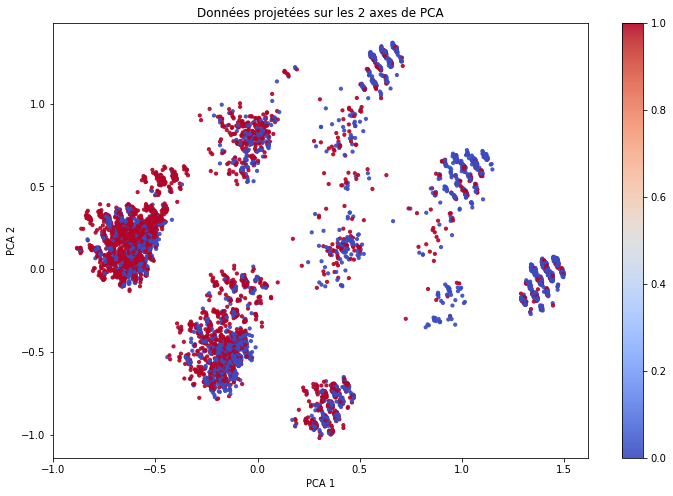

La part de variance expliquée est 0.33


In [105]:
# affichage d'un nouveau pca avec le preprocessing avancé

train = trainset.copy()

# on repasse sur un min max car ça affiche mieux les valeurs que le standascaler
scaler = MinMaxScaler((0,1))

# application du preprocessing
X_train, y_train = preprocessing_V1_5(train, False)

# création du pca
pca = PCA(2)
X_train_pca = pca.fit_transform(X_train)

plt.figure(figsize=(12,8))

plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='coolwarm', s=10, alpha=0.9)
plt.colorbar()

plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

plt.title("Données projetées sur les 2 axes de PCA")
plt.show();

print("La part de variance expliquée est", round(pca.explained_variance_ratio_.sum(),2))

# les données sont mieux classé qu'auparavant

In [106]:
# on fait un nouveau dataframe avec le 1er resultat du RF
scores_RF = pd.DataFrame(columns= ['1st RF & 1st preprocessing'],
                                   index=   ['Accuracy', 'Precision', 'Recall', 'F1','Roc_auc']
                                  )

scores_RF['1st RF & 1st preprocessing'] = pd.DataFrame(models_scores_standard_scaler['Random Forest Classifier'])

train = trainset.copy()
# on applique le preprocessing V2 pour ne peut avoir de scaler
X_train, y_train = preprocessing_V2(train, False)

# Random Forest
RF_clf = RandomForestClassifier(random_state=0)

# cross validation, on enregistre le score sur 5 métrique
scores = cross_validate(RF_clf, X_train, y_train,
                        scoring=['accuracy', 'precision', 'recall', 'f1', 'roc_auc'], 
                        cv=4, n_jobs=-1)

# on enregistre le score avec le preprocessing avancé
scores_RF['1st RF & 2nd preprocessing'] = [scores['test_accuracy'].mean(),
                                       scores['test_precision'].mean(),
                                       scores['test_recall'].mean(),
                                       scores['test_f1'].mean(),
                                       scores['test_roc_auc'].mean()]

# on mesure la différence entre les deux preprocessing
scores_RF['Diff entre preprocessing'] = scores_RF['1st RF & 2nd preprocessing'] - scores_RF['1st RF & 1st preprocessing']

(scores_RF*100).style.highlight_max(color = 'lightgreen', axis = 1)

,1st RF & 1st preprocessing,1st RF & 2nd preprocessing,Diff entre preprocessing
Accuracy,71.841398,72.323029,0.481631
Precision,72.936796,73.265322,0.328526
Recall,64.708852,65.675922,0.967070
F1,68.571827,69.261645,0.689818
Roc_auc,77.520618,78.644876,1.124258


## Optimisation du Random Forest

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Validation score : 0.8015409621241476
Best estimator : RandomForestClassifier(criterion='entropy', max_depth=21, max_features=2,
                       min_samples_split=24, n_estimators=181, n_jobs=-1,
                       random_state=0)
Train score 0.899907534818079


,Importance
balance,0.138180
age,0.134550
day,0.127423
pdays,0.092343
poutcome_success,0.087941
contact_unknown,0.051550
contact_cellular,0.046700
housing,0.042709
marital,0.031749
education,0.029272


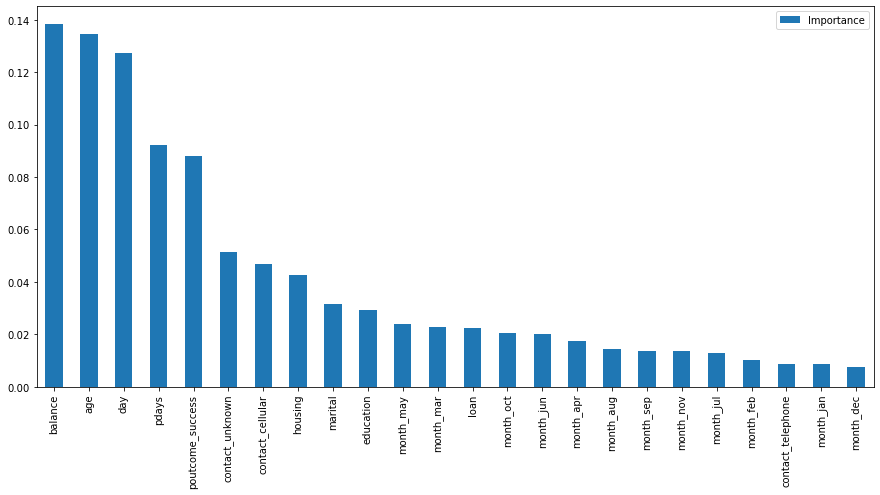

In [107]:
train = trainset.copy()

X_train, y_train = preprocessing_V2(train, False)

# Random Forest
RF_clf = RandomForestClassifier(random_state=0, n_jobs=-1)

# paramètre finaux
param_rf = dict(criterion= ['entropy'], # gini, entropy 
                n_estimators = [181],  
                max_depth = [21],      
                max_features = [2],
                min_samples_split = [24],
                min_samples_leaf = [1]
               )

# paramètre testé
# class_weight

grid_rf = GridSearchCV(RF_clf, param_rf, cv=4, verbose=1, scoring='roc_auc')

grid_rf.fit(X_train, y_train)

print('Validation score :', grid_rf.best_score_)
print('Best estimator :', grid_rf.best_estimator_)
print('Train score', grid_rf.score(X_train, y_train))


# feature importance, très biaisé
# les 4 features numériques sont premières car elles peuvent passer plusieurs fois dans les arbres du Random Forest
# le graphique permet d'établir un ordre entres les features numériques et les features catégoriques mais pas entre les 2
feats={}
for feature, importance in zip(X_train.columns, grid_rf.best_estimator_.feature_importances_):
    feats[feature] = importance

importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Importance'})
importances.sort_values(by='Importance', ascending=False).plot.bar(figsize=(15,7));

importances.sort_values(by='Importance', ascending=False).head(10)

In [108]:
# info sur X_train après le preprocessing final
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8928 entries, 6978 to 2732
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   age                8928 non-null   int64
 1   marital            8928 non-null   int64
 2   education          8928 non-null   int64
 3   balance            8928 non-null   int64
 4   housing            8928 non-null   uint8
 5   loan               8928 non-null   uint8
 6   day                8928 non-null   int64
 7   pdays              8928 non-null   int64
 8   poutcome_success   8928 non-null   int64
 9   contact_cellular   8928 non-null   uint8
 10  contact_telephone  8928 non-null   uint8
 11  contact_unknown    8928 non-null   uint8
 12  month_apr          8928 non-null   uint8
 13  month_aug          8928 non-null   uint8
 14  month_dec          8928 non-null   uint8
 15  month_feb          8928 non-null   uint8
 16  month_jan          8928 non-null   uint8
 17  month_jul  

### Récap de performance

In [109]:
scores_RF = scores_RF.drop('Diff entre preprocessing', axis=1)

In [110]:
# on affiche le score de l'optimisation et on fait un comparatif avec les modèles RF simple
scores = cross_validate(grid_rf.best_estimator_, X_train, y_train,
                            scoring=['accuracy', 'precision', 'recall', 'f1', 'roc_auc'], 
                            cv=4, n_jobs=-1)


scores_RF['Random Forest Final'] = [scores['test_accuracy'].mean(),
                                     scores['test_precision'].mean(),
                                     scores['test_recall'].mean(),
                                     scores['test_f1'].mean(),
                                     scores['test_roc_auc'].mean()]

scores_RF['Final vs 1st'] = scores_RF['Random Forest Final'] - scores_RF['1st RF & 1st preprocessing']
scores_RF['Final vs 2nd'] = scores_RF['Random Forest Final'] - scores_RF['1st RF & 2nd preprocessing']

(scores_RF*100).style.highlight_max(color = 'lightgreen', axis = 1)

,1st RF & 1st preprocessing,1st RF & 2nd preprocessing,Random Forest Final,Final vs 1st,Final vs 2nd
Accuracy,71.841398,72.323029,74.025538,2.184140,1.702509
Precision,72.936796,73.265322,77.291688,4.354892,4.026366
Recall,64.708852,65.675922,64.142592,-0.566260,-1.533331
F1,68.571827,69.261645,70.101452,1.529625,0.839807
Roc_auc,77.520618,78.644876,80.154096,2.633479,1.509220


### ROC AUC RF Train

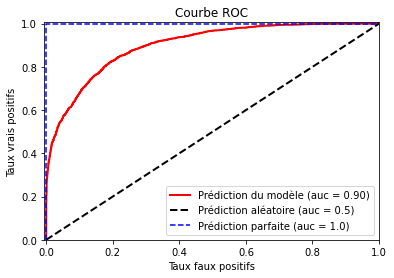

In [111]:
grid_rf.cv_results_

probs = grid_rf.predict_proba(X_train)

# calcul du roc auc
fpr, tpr, seuils = roc_curve(y_train, probs[:,1], pos_label=1)
roc_auc = auc(fpr, tpr)

# affichage
plt.plot(fpr, tpr, color='red', lw=2, label='Prédiction du modèle (auc = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--', label='Prédiction aléatoire (auc = 0.5)')
plt.plot([0, 0, 1], [0, 1, 1], linestyle='--', color='blue', label='Prédiction parfaite (auc = 1.0)')
plt.xlim([-0.006, 1.0])
plt.ylim([0.00, 1.006])
plt.xlabel('Taux faux positifs')
plt.ylabel('Taux vrais positifs')
plt.title('Courbe ROC')
plt.legend(loc="lower right")
plt.show();

## Cumulative Gains Curve

,deposit,pred,cumul_deposit,prop_deposit,contact,prop_contact,reussite,age,marital,education,...,month_dec,month_feb,month_jan,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep
3338,1,0.968483,1,0.000236,1,0.000112,1.000000,35,3,2,...,0,0,0,0,0,1,0,0,0,0
3322,1,0.967882,2,0.000472,2,0.000224,1.000000,34,3,3,...,0,0,0,0,0,1,0,0,0,0
3316,1,0.967411,3,0.000708,3,0.000336,1.000000,35,3,3,...,0,0,0,0,0,1,0,0,0,0
3329,1,0.967049,4,0.000944,4,0.000448,1.000000,52,3,2,...,0,0,0,0,0,1,0,0,0,0
3336,1,0.966885,5,0.001180,5,0.000560,1.000000,36,3,3,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9635,0,0.032407,4239,1.000000,8924,0.999552,0.475011,38,3,2,...,0,0,0,0,0,0,1,0,0,0
7761,0,0.022720,4239,1.000000,8925,0.999664,0.474958,43,3,1,...,0,0,0,0,0,0,1,0,0,0
11103,0,0.021102,4239,1.000000,8926,0.999776,0.474905,51,3,1,...,0,0,0,0,0,0,1,0,0,0
5743,0,0.018501,4239,1.000000,8927,0.999888,0.474852,51,3,1,...,0,0,0,0,0,0,1,0,0,0


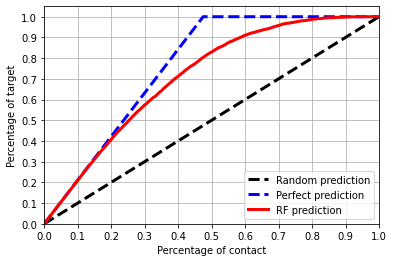

In [112]:
# figure
plt.xlim(0,1)
plt.ylim(0,1.05)
plt.xlabel('Percentage of contact')
plt.ylabel('Percentage of target')
plt.grid()
plt.xticks(np.arange(0, 1.1, step=0.1))
plt.yticks(np.arange(0, 1.1, step=0.1))


# random line
plt.plot([0,1], [0,1], '--', color='black', label='Random prediction', linewidth=3)

# best line
best_prediction = y_train.value_counts(normalize=True)[1]
plt.plot([0, best_prediction, 1], [0,1, 1], '--', color='blue', label='Perfect prediction', linewidth=3)

# prep dataset pour afficher la prediction du model
train_df = pd.DataFrame(y_train)
train_df['pred'] = probs[:,1]
train_df = train_df.sort_values('pred', ascending=False)
train_df['cumul_deposit'] = train_df['deposit'].cumsum()
train_df['prop_deposit'] = train_df['cumul_deposit'] / train_df['cumul_deposit'].max()
train_df['contact'] = [x for x in range(1,(train_df.shape[0])+1)]
train_df['prop_contact'] = train_df['contact'] / train_df.shape[0]

# prediction line
plt.plot(train_df['prop_contact'], train_df['prop_deposit'], color='red', label='RF prediction', linewidth=3)

# légende
plt.legend();

train_df['reussite'] = train_df['cumul_deposit'] / train_df['contact']
train_df = train_df.join(X_train)
train_df

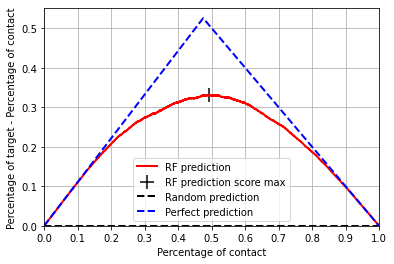

In [113]:
# "score" de prédiction
train_df['RF Prediction'] = train_df['prop_deposit'] - train_df['prop_contact']

plt.xlabel('Percentage of contact')
plt.ylabel('Percentage of target - Percentage of contact')

plt.grid()
plt.xticks(np.arange(0, 1.1, step=0.1))
plt.xlim(0,1)
plt.ylim(-0.0001,0.55)
# predicted line
plt.plot(train_df['prop_contact'], train_df['RF Prediction'], color='red', label='RF prediction', linewidth=2)

# max predicted line
max_predicted_vertical = train_df['RF Prediction'].max()
max_predicted_horizontal = train_df[train_df['RF Prediction'] == max_predicted_vertical]['prop_contact']
plt.scatter(max_predicted_horizontal, max_predicted_vertical, c='black', marker='+', s=200, label='RF prediction score max')
    
# random line
plt.plot([0,1], [0,0], '--', color='black', label='Random prediction', linewidth=2)

# perfect line
train_df[train_df['contact'] == (train_df['deposit'] == 1).sum()]
plt.plot([0, best_prediction, 1], [0,1-best_prediction, 0], '--', color='blue', label='Perfect prediction', linewidth=2)

plt.legend();

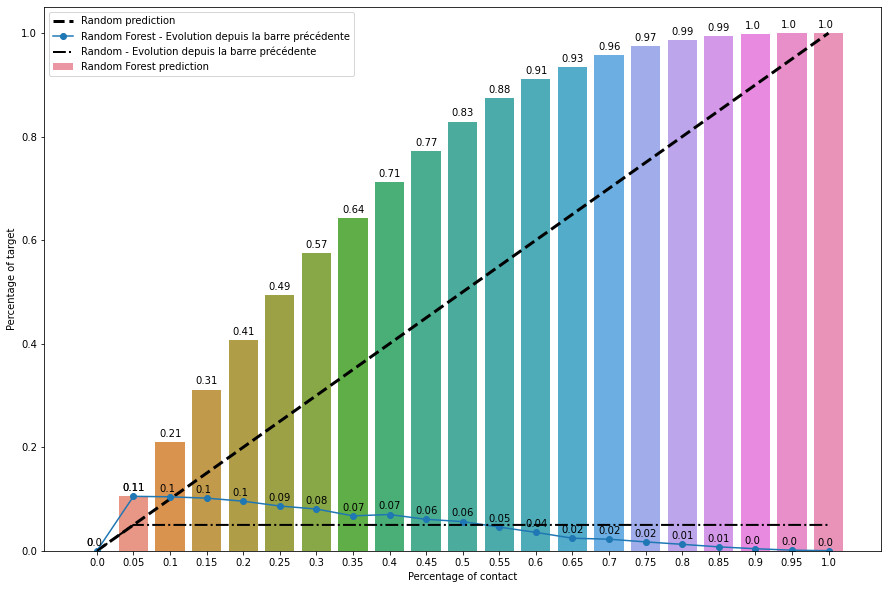

In [114]:
score_contact = []
percent_contact = []

# Cumulative gain curve mais avec des bar permettant de voir l'évolution tous le 5% de client contacté
for x in range(0,21):
    percentage_contact = x / 20
    percentage_contact = train_df[train_df['prop_contact'] >= percentage_contact]['prop_contact'].head(1).value_counts().index.tolist()[0]
    percent_contact.append(round(percentage_contact, 2))
    
    score = train_df[train_df['prop_contact'] == percentage_contact]['prop_deposit'].head(1).value_counts().index.tolist()[0]
    score_contact.append(round(score,4))

plt.figure(figsize=(15,10))
sns.barplot(x=percent_contact, y=score_contact, ci=50, label='Random Forest prediction')
plt.xlabel('Percentage of contact')
plt.ylabel('Percentage of target')

for x in range(0,21):
    plt.text(percent_contact[x]*20-0.3, score_contact[x]+0.01, str(round(score_contact[x],2)))
    
# random line
plt.plot([0,20], [0,1], '--', color='black', label='Random prediction', linewidth=3);

# evolution entre palier de 0.05%
evolution_score = []

for i in range(len(score_contact)):
    if i > 0:
        evolution_score.append(score_contact[i] - score_contact[i-1])
    else:
        evolution_score.append(0)
        
plt.plot(range(len(score_contact)), evolution_score, marker='o', label='Random Forest - Evolution depuis la barre précédente')
for x in range(21):
    plt.text(percent_contact[x]*20-0.3, evolution_score[x]+0.01, str(round(evolution_score[x],2)))

# random evolution
plt.plot([0,1,20], [0,0.05,0.05], '-.', color='black', label='Random - Evolution depuis la barre précédente', linewidth=2)


plt.legend();


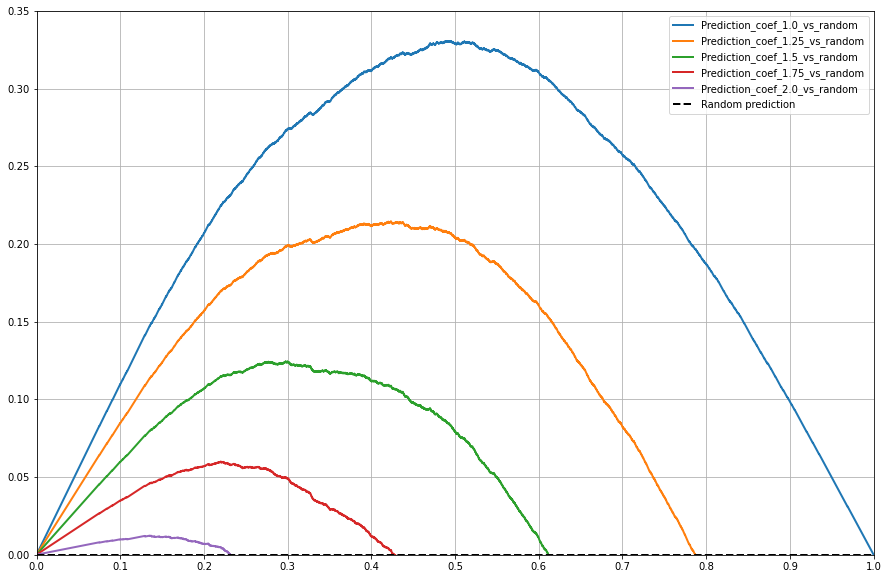

In [115]:
list_multiplicateur = [] 

# k permet de générer le coef multiplicateur
for k in range(0,5):
    multiplicateur = round(k*0.25+ 1, 2)
    list_multiplicateur.append('Prediction_coef_'+str(multiplicateur)+'_vs_random')
    train_df[list_multiplicateur[k]] = train_df['prop_deposit'] - train_df['prop_contact']*multiplicateur

# figure
plt.figure(figsize=(15,10))
plt.grid()
plt.xticks(np.arange(0, 1.1, step=0.1))
plt.xlim(0,1)
plt.ylim(-0.0001,0.35)
# on trace les predictions avec coef
for col in list_multiplicateur:
    plt.plot(train_df['prop_contact'], train_df[col], linewidth=2, label=col)
# random line
plt.plot([0,1], [0,0], '--', color='black', label='Random prediction', linewidth=2)
plt.legend();

Text(0, 0.5, 'Pourcentage de deposit trouvé - Pourcentage de contact')

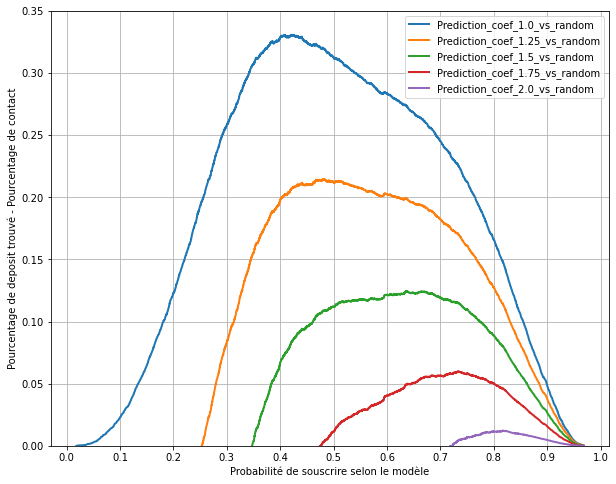

In [116]:
plt.figure(figsize=(10,8))
plt.grid()
plt.xticks(np.arange(0, 1.1, step=0.1))
plt.ylim(0,0.35)

# se lit de droite à gauche, permet de voir la meme info que précédemment mais basé sur le threshold / la probabilté
for col in list_multiplicateur:
    plt.plot(train_df['pred'], train_df[col], linewidth=2, label=col)
plt.legend()
plt.xlabel("Probabilité de souscrire selon le modèle")
plt.ylabel("Pourcentage de deposit trouvé - Pourcentage de contact")

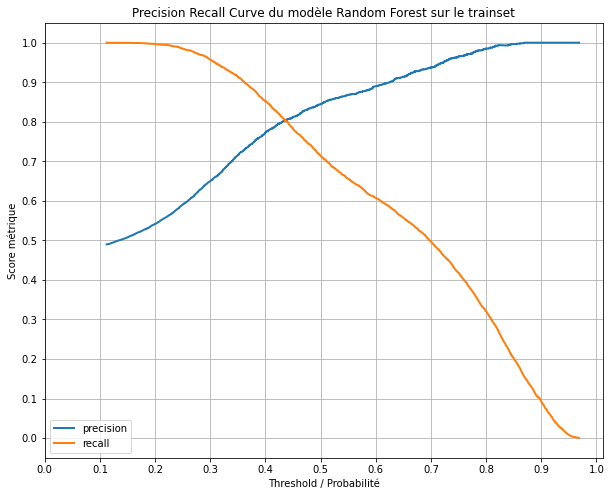

In [117]:
from sklearn.metrics import precision_recall_curve

# on calcule la precision recall curbe
precision, recall, threshold = precision_recall_curve(y_train, probs[:,1])

# affichage de recall et precision
plt.figure(figsize=(10,8))
plt.plot(threshold, precision[:-1], label='precision', linewidth=2)
plt.plot(threshold, recall[:-1], label='recall', linewidth=2)

# info graphique
plt.grid()
plt.xticks(np.arange(0, 1.1, step=0.1))
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xlabel('Threshold / Probabilité')
plt.ylabel('Score métrique')
plt.title('Precision Recall Curve du modèle Random Forest sur le trainset')

plt.legend();

# Comparaison entre validation score et train score

In [118]:
# on drop les comparatifs précédents
scores_RF = scores_RF.drop('Final vs 1st', axis=1)
scores_RF = scores_RF.drop('Final vs 2nd', axis=1)


scores = cross_validate(grid_rf.best_estimator_, X_train, y_train,
                            scoring=['accuracy', 'precision', 'recall', 'f1', 'roc_auc'], 
                            cv=4, n_jobs=-1)

# calcul du train score sur toutes les métriques
y_pred_train = grid_rf.best_estimator_.predict(X_train)
y_probas_train = grid_rf.best_estimator_.predict_proba(X_train)

# roc auc
fpr, tpr, seuils = roc_curve(y_train, y_probas_train[:,1], pos_label=1)
roc_auc = auc(fpr, tpr)

scores_RF['Random Forest Train'] = [grid_rf.best_estimator_.score(X_train, y_train),
                                     precision_score(y_train, y_pred_train),
                                     recall_score(y_train, y_pred_train),
                                     f1_score(y_train,y_pred_train),
                                     roc_auc]

# on calcul la différence
scores_RF['Train - Validation'] = scores_RF['Random Forest Train'] - scores_RF['Random Forest Final']

# affichage des scores
(scores_RF*100).style.highlight_max(color = 'lightgreen', axis = 1)

,1st RF & 1st preprocessing,1st RF & 2nd preprocessing,Random Forest Final,Random Forest Train,Train - Validation
Accuracy,71.841398,72.323029,74.025538,80.174731,6.149194
Precision,72.936796,73.265322,77.291688,84.454368,7.162680
Recall,64.708852,65.675922,64.142592,71.384761,7.242169
F1,68.571827,69.261645,70.101452,77.371516,7.270064
Roc_auc,77.520618,78.644876,80.154096,89.990753,9.836657


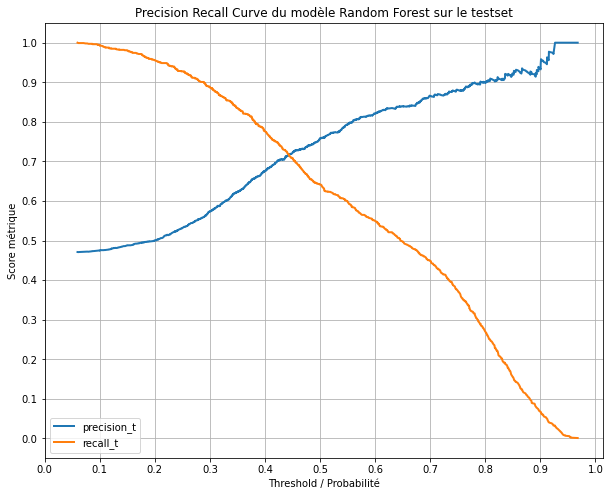

In [119]:
# on réinitialise le testset
test = testset.copy()

# on fait le preprocessing sur le test (true pour que transform récupère les infos de Train)
X_test, y_test = preprocessing_V2(test, True)

probs_test = grid_rf.best_estimator_.predict_proba(X_test)

# precision recall curve
precision_t, recall_t, threshold_t = precision_recall_curve(y_test, probs_test[:,1])

# figure
plt.figure(figsize=(10,8))
plt.plot(threshold_t, precision_t[:-1], label='precision_t', linewidth=2)
plt.plot(threshold_t, recall_t[:-1], label='recall_t', linewidth=2)

# détail figure
plt.grid()
plt.xticks(np.arange(0, 1.1, step=0.1))
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xlabel('Threshold / Probabilité')
plt.ylabel('Score métrique')
plt.title('Precision Recall Curve du modèle Random Forest sur le testset')

plt.legend();

### ROC AUC RF Test

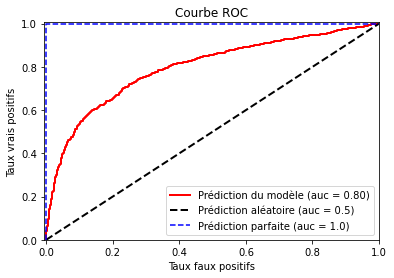

In [120]:
probs = grid_rf.predict_proba(X_test)

# roc auc test
fpr, tpr, seuils = roc_curve(y_test, probs[:,1], pos_label=1)
roc_auc = auc(fpr, tpr)

# figure
plt.plot(fpr, tpr, color='red', lw=2, label='Prédiction du modèle (auc = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--', label='Prédiction aléatoire (auc = 0.5)')
plt.plot([0, 0, 1], [0, 1, 1], linestyle='--', color='blue', label='Prédiction parfaite (auc = 1.0)')
plt.xlim([-0.006, 1.0])
plt.ylim([0.00, 1.006])
plt.xlabel('Taux faux positifs')
plt.ylabel('Taux vrais positifs')
plt.title('Courbe ROC')
plt.legend(loc="lower right")
plt.show();

,deposit,pred,cumul_deposit,prop_deposit,contact,prop_contact,reussite,age,marital,education,...,month_dec,month_feb,month_jan,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep
3020,1,0.967670,1,0.000954,1,0.000448,1.000000,29,1,3,...,1,0,0,0,0,0,0,0,0,0
2791,1,0.955089,2,0.001908,2,0.000896,1.000000,55,2,2,...,0,0,0,0,0,0,0,0,1,0
2813,1,0.954985,3,0.002863,3,0.001344,1.000000,60,3,2,...,0,0,0,0,0,0,0,0,1,0
2661,1,0.953330,4,0.003817,4,0.001792,1.000000,58,3,3,...,0,0,0,0,0,0,0,0,0,1
3022,1,0.953140,5,0.004771,5,0.002240,1.000000,57,3,2,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8526,0,0.057844,1048,1.000000,2228,0.998208,0.470377,48,3,3,...,0,0,0,0,0,0,1,0,0,0
5544,0,0.057158,1048,1.000000,2229,0.998656,0.470166,49,3,1,...,0,0,0,0,0,0,1,0,0,0
6692,0,0.047590,1048,1.000000,2230,0.999104,0.469955,33,3,2,...,0,0,0,0,0,0,1,0,0,0
10862,0,0.044206,1048,1.000000,2231,0.999552,0.469745,42,3,2,...,0,0,0,0,0,0,1,0,0,0


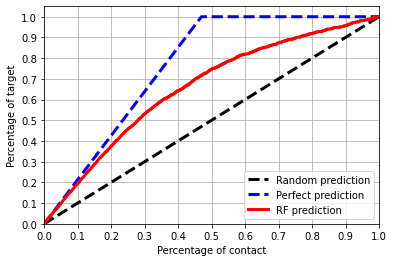

In [121]:
# figure
plt.xlim(0,1)
plt.ylim(0,1.05)
plt.xlabel('Percentage of contact')
plt.ylabel('Percentage of target')
plt.grid()
plt.xticks(np.arange(0, 1.1, step=0.1))
plt.yticks(np.arange(0, 1.1, step=0.1))


# random line
plt.plot([0,1], [0,1], '--', color='black', label='Random prediction', linewidth=3)

# best line
best_prediction = y_test.value_counts(normalize=True)[1]
plt.plot([0, best_prediction, 1], [0,1, 1], '--', color='blue', label='Perfect prediction', linewidth=3)

# prep dataset pour afficher la prediction du model
test_df = pd.DataFrame(y_test)
test_df['pred'] = probs[:,1]
test_df = test_df.sort_values('pred', ascending=False)
test_df['cumul_deposit'] = test_df['deposit'].cumsum()
test_df['prop_deposit'] = test_df['cumul_deposit'] / test_df['cumul_deposit'].max()
test_df['contact'] = [x for x in range(1,(test_df.shape[0])+1)]
test_df['prop_contact'] = test_df['contact'] / test_df.shape[0]

# prediction line
plt.plot(test_df['prop_contact'], test_df['prop_deposit'], color='red', label='RF prediction', linewidth=3)

# légende
plt.legend();

test_df['reussite'] = test_df['cumul_deposit'] / test_df['contact']
test_df = test_df.join(X_test)
test_df

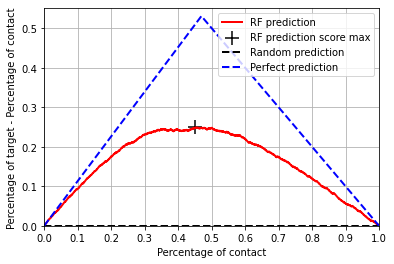

In [122]:
# on calcul le "score", difference entre proportion de deposit trouvé vs proportion de contact
test_df['RF Prediction'] = test_df['prop_deposit'] - test_df['prop_contact']

# info graphiqie
plt.xlabel('Percentage of contact')
plt.ylabel('Percentage of target - Percentage of contact')
plt.grid()
plt.xticks(np.arange(0, 1.1, step=0.1))
plt.xlim(0,1)
plt.ylim(-0.0001,0.55)
# predicted line
plt.plot(test_df['prop_contact'], test_df['RF Prediction'], color='red', label='RF prediction', linewidth=2)

# max predicted line
max_predicted_vertical = test_df['RF Prediction'].max()
max_predicted_horizontal = test_df[test_df['RF Prediction'] == max_predicted_vertical]['prop_contact']
plt.scatter(max_predicted_horizontal, max_predicted_vertical, c='black', marker='+', s=200, label='RF prediction score max')
    
# random line
plt.plot([0,1], [0,0], '--', color='black', label='Random prediction', linewidth=2)

# perfect line
test_df[test_df['contact'] == (test_df['deposit'] == 1).sum()]
plt.plot([0, best_prediction, 1], [0,1-best_prediction, 0], '--', color='blue', label='Perfect prediction', linewidth=2)

plt.legend();

In [123]:
# prediction de X_test
y_pred = grid_rf.best_estimator_.predict(X_test)

# classification report sur le test
print(classification_report(y_test,y_pred))

# matrice de confusion sur le test (threshold 0.5)
pd.crosstab(y_test, y_pred, rownames=['Reality'], colnames=['Predicted'])

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      1184
           1       0.76      0.64      0.69      1048

    accuracy                           0.74      2232
   macro avg       0.74      0.73      0.73      2232
weighted avg       0.74      0.74      0.73      2232



Predicted,0,1
Reality,,
0,969,215
1,376,672


In [124]:
# on drop les comparatif précédent, 
# on drop le train qui ne nous intéresse pas

scores_RF = scores_RF.drop('Random Forest Train', axis=1)
scores_RF = scores_RF.drop('Train - Validation', axis=1)
scores_RF = scores_RF.drop('1st RF & 1st preprocessing', axis=1)
scores_RF = scores_RF.drop('1st RF & 2nd preprocessing', axis=1)

# calcul du train score
y_pred_test = grid_rf.best_estimator_.predict(X_test)
y_probas_test = grid_rf.best_estimator_.predict_proba(X_test)

# roc auc
fpr, tpr, seuils = roc_curve(y_test, y_probas_test[:,1], pos_label=1)
roc_auc = auc(fpr, tpr)

# calcul des métrique pour test
scores_RF['Random Forest Test'] = [grid_rf.best_estimator_.score(X_test, y_test),
                                     precision_score(y_test, y_pred_test),
                                     recall_score(y_test, y_pred_test),
                                     f1_score(y_test,y_pred_test),
                                     roc_auc]

# différence entre test et validation
scores_RF['Test - Validation'] = scores_RF['Random Forest Test'] - scores_RF['Random Forest Final']

# affichage des score
(scores_RF*100).style.highlight_max(color = 'lightgreen', axis = 1)

,Random Forest Final,Random Forest Test,Test - Validation
Accuracy,74.025538,73.521505,-0.504032
Precision,77.291688,75.760992,-1.530696
Recall,64.142592,64.122137,-0.020454
F1,70.101452,69.457364,-0.644088
Roc_auc,80.154096,79.603121,-0.550975


### Interprétation via arbre de décision 

In [125]:
probs = grid_rf.predict_proba(X_train)
preds = [0 if x<0.5 else 1 for x in probs[:,1]]

dt_clf = DecisionTreeClassifier(random_state=0, criterion='entropy')
dt_clf.fit(X_train, preds);

#Comparaison des prédictions
print("Différence de prédiction sur le trainset entre notre modèle et l'arbre de décision :", sum(preds!=dt_clf.predict(X_train)))

# Comparaison des prédictions sur le jeu de test 
probs = grid_rf.predict_proba(X_test)
preds = [0 if x<0.5 else 1 for x in probs[:,1]]

print("Différence de prédiction sur le testset entre notre modèle et l'arbre de décision :", sum(preds!=dt_clf.predict(X_test))/len(X_test))

Différence de prédiction sur le trainset entre notre modèle et l'arbre de décision : 0
Différence de prédiction sur le testset entre notre modèle et l'arbre de décision : 0.07571684587813621


In [126]:
# 2746 63% y, #5415 46% n , #5566 19% n

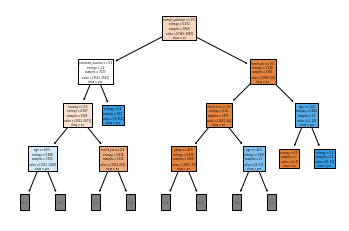

In [127]:
from sklearn.tree import plot_tree

plot_tree(dt_clf, feature_names=X_train.columns.tolist(),
          class_names=['no', 'yes'],
          max_depth=3, filled=True);

# sauvegarde de figure
# plt.savefig('tree_example.jpg',format='jpg', dpi=1000)

## Arbre simulant le RF

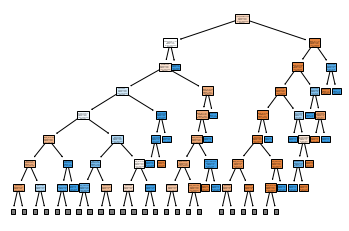

In [128]:
# génération de plusieurs arbre pour les sauvegarder
for k in range(1,8):

    plot_tree(dt_clf, feature_names=X_train.columns.tolist(),
              class_names=['no', 'yes'],
              max_depth=k, filled=True);

# sauvegarde de figure
#     plt.savefig('tree_depth_'+str(k)+'.jpg',format='jpg', dpi=1200)

## Interprétation SHAP

In [100]:
import shap

explainer = shap.TreeExplainer(grid_rf.best_estimator_)

## Intéprétation globale

In [130]:
# CODE TRES LONG SUR L'ENSEMBLE DU TRAINSET, POSSIBILITE DE PRENDRE UNIQUEMENT UNE PARTIE DE XTRAIN
# SI C'EST LE CAS, IL FAUT ADAPTER LE CODE PAR LA SUITE AU MEME FORMAT ex : X_train[:1000]
# choosen_instance = X_train[:1000]
choosen_instance = X_train
shap_values = explainer.shap_values(choosen_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], choosen_instance)

shap.plots.force is slow for many thousands of rows, try subsampling your data.


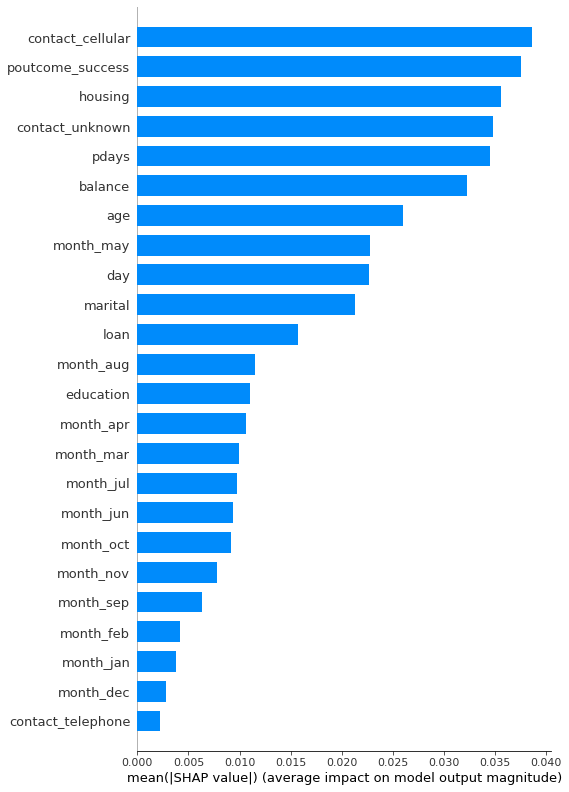

In [131]:
# shap value, impact moyen
shap.summary_plot(shap_values[1], X_train, plot_type='bar', max_display=X_train.shape[1])

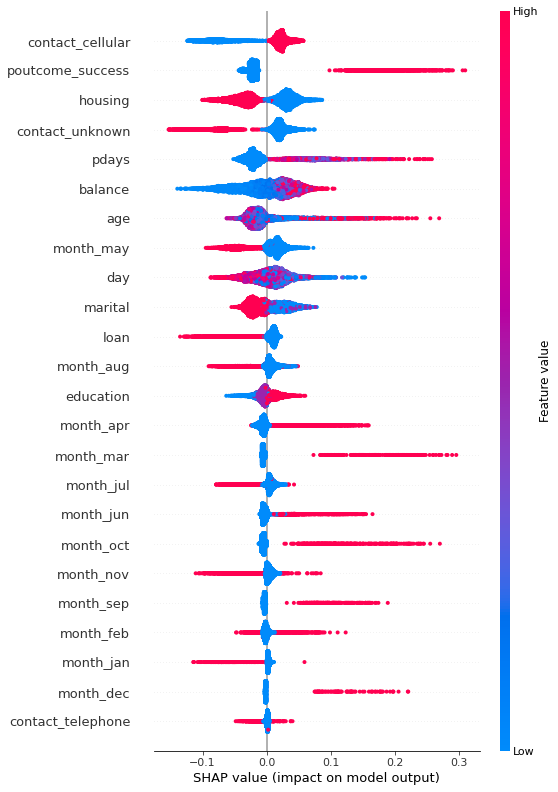

In [132]:
# shap value, impact selon la valeur de la feature
shap.summary_plot(shap_values[1], X_train, max_display=X_train.shape[1])

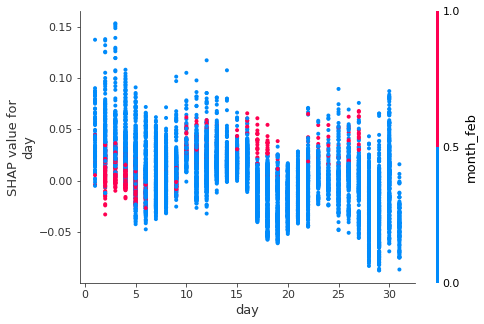

In [133]:
# mois de février, un des rares mois ou appeler en fin de mois est mieux
shap.dependence_plot("day", shap_values[1], X_train, interaction_index="month_feb")

# Intérptrétation locale

In [134]:
import sklearn

#  permet de mélanger le dataset pour trouver des cas différents
# testset_shuffled=sklearn.utils.shuffle(testset)
# testset_shuffled.head(20)

# testset.loc[[1567,10606,651,8582, 7679]]

In [135]:
testset.loc[[1567]]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,pdays,previous,poutcome,deposit
1567,73,retired,married,primary,no,253,no,no,cellular,20,apr,-1,0,unknown,yes


In [136]:
# exemple 1
specific_instance = X_test.loc[[1567]]
shap_values_specific = explainer.shap_values(specific_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_specific[1], specific_instance)

In [137]:
testset.loc[[10606]]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,pdays,previous,poutcome,deposit
10606,39,services,divorced,secondary,no,1957,yes,yes,cellular,20,nov,-1,0,unknown,no


In [138]:
# exemple 2
specific_instance = X_test.loc[[10606]]
shap_values_specific = explainer.shap_values(specific_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_specific[1], specific_instance)

In [139]:
testset.loc[[651]]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,pdays,previous,poutcome,deposit
651,44,technician,married,primary,no,755,no,yes,cellular,31,jul,-1,0,unknown,yes


In [140]:
# exemple 3
specific_instance = X_test.loc[[651]]
shap_values_specific = explainer.shap_values(specific_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_specific[1], specific_instance)

In [141]:
testset.loc[[8582]]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,pdays,previous,poutcome,deposit
8582,26,student,single,tertiary,no,10086,no,no,cellular,8,jul,78,2,success,no


In [142]:
# exemple 4
specific_instance = X_test.loc[[8582]]
shap_values_specific = explainer.shap_values(specific_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_specific[1], specific_instance)

In [143]:
testset.loc[[7679]]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,pdays,previous,poutcome,deposit
7679,40,housemaid,divorced,secondary,no,108,no,no,unknown,9,may,-1,0,unknown,no


In [144]:
# exemple 5
specific_instance = X_test.loc[[7679]]
shap_values_specific = explainer.shap_values(specific_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_specific[1], specific_instance)

In [145]:
testset.loc[[8164]]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,pdays,previous,poutcome,deposit
8164,31,management,single,tertiary,no,0,yes,yes,cellular,14,may,352,3,failure,no


In [146]:
# exemple 6
specific_instance = X_test.loc[[8164]]
shap_values_specific = explainer.shap_values(specific_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_specific[1], specific_instance)